In [1]:
%matplotlib notebook

# %env

# import scipy as scp
import numpy as np
import numba as nb
from numba import cuda
import operator as op
import time
import matplotlib as mpl
import pandas as pd
from pandas import HDFStore, DataFrame
from matplotlib import animation, rc
from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt
import ipywidgets as widgets
from ipywidgets import interactive, Button
from IPython.display import display, HTML
import netCDF4 as nc
from math import sqrt
mysqrt= sqrt # as opposed to nb.sqrt
xp = np

In [2]:
# common numbers in float32 form to speed up calculations
zero = np.float32(0)
p5 = np.float32(0.5)
one = np.float32(1)
two = np.float32(2)

In [3]:
# differential functions
@nb.njit(fastmath=True,parallel=True)
def d_dx(a, dx):
#     ddx = ( a[:-1] - a[1:] )*(np.float32(-1)/dx) 
    return ( a[1:] - a[:-1] )*(np.float32(1)/dx) # ddx
@nb.njit(fastmath=True,parallel=True)
def d_dy(a, dy):
#     ddy = ( a[:,:-1] - a[:,1:] )*(np.float32(-1)/dy)
    return ( a[:,1:] - a[:,:-1] )*(np.float32(1)/dy)


# simple environments or initial conditions


def lingauss(shape, w, cx = 0, cy = 0, theta = 0, cutoff = 0.05, norm = False):#, win = (-2, 2)):
    """returns a 1d gaussian on a 2d array of shape 'shape'"""
    x = np.arange(0, shape[0])#linspace( win[0], win[1], shape[0] )
    y = np.arange(0, shape[1])#linspace( win[0], win[1], shape[1] )
    xx, yy = np.meshgrid(x, y, indexing='ij')
#     xy = (yy, xx)[ax]
    xy = np.cos(theta)*(xx-cx) + np.sin(theta)*(yy-cy) # lin comb of x, y, to rotate gaussian
    h = np.exp( - ( xy*xy ) / (2*w*w) )
    if norm:
        h = h / (np.sqrt(two*np.pi)*w)
    
    h -= cutoff
    h[np.less(h, zero)] = zero
    return (h)



def planegauss(shape, wx, wy, cx=0, cy=0, theta = 0, cutoff = 0.05, norm = False):
    h1 = lingauss(shape, wx, cx=cx, cy=cy, theta = theta, cutoff=cutoff, norm=norm)
    h2 = lingauss(shape, wy, cx=cx, cy=cy, theta = theta + np.pi/2, cutoff=cutoff, norm=norm)
    return h1*h2


def seismic(shape, width, length, a1 = 1, a2 = 1, cx=0, cy=0, theta=0, cutoff=0.05, norm=False):
    """returns simple seismic initial condition on array with shape 'shape'
        theta - angle from directly east seismic condition points, measured hill-to-valley
        length - length across (long direction)
        width - distance across hill-to-valley (short direction)"""
    offx = width*np.cos(theta)*0.5
    offy = width*np.sin(theta)*0.5
    h1 = a1*planegauss(shape, width/2, length, cx=cx+offx, cy=cy+offy, theta = theta, cutoff=cutoff, norm=norm) # 'hill'
    h2 = -a2*planegauss(shape, width/2, length, cx=cx-offx, cy=cy-offy, theta = theta, cutoff=cutoff, norm=norm) # 'valley'
    
    return h1+h2

<IPython.core.display.Javascript object>


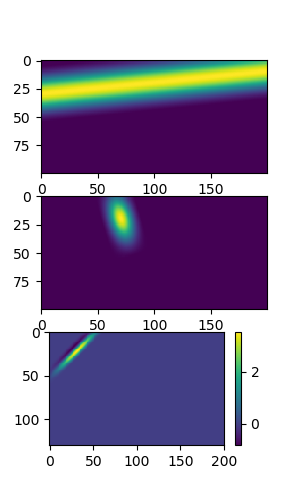

In [4]:
fig = plt.figure(11, figsize=(3, 5))

sub = plt.subplot(311)
plt.imshow(lingauss((100, 200), 10, cx = 30, theta=0.1))

sub = plt.subplot(312)
plt.imshow(planegauss((100, 200), 7, 14, cx = 20, cy = 70, theta=5))

sub = plt.subplot(313)
plt.imshow(seismic((130, 200), 5, 20, a1=4, a2=1, cx = 20, cy = 30, theta=np.pi/4))
plt.colorbar()
plt.show()


In [5]:
# physics constants
class p():
    g = np.float32(9.81) # gravity

class State(): # state
    def __init__(self, h, n, u, v, dx, dy, lat, lon):
        
        self.dx = dx
        self.dy = dy
        self.lat = lat
        self.lon = lon
#         self.lats, self.lons = np.meshgrid(self.lat, self.lon)
#         self.lat, self.lon = np.meshgrid(self.lat, self.lon) # lattitude/longitude chunk simulation area stretches over
        self.h = h
    
        self.maxws = np.sqrt(np.max(self.h)*p.g) # maximum wave speed
        
        self.n = np.asarray(n, dtype=np.float32) # surface height (eta)
        self.u = np.asarray(u, dtype=np.float32) # x vel array
        self.v = np.asarray(v, dtype=np.float32) # y vel array
        
        #make sure h is the same shap as n (eta)
        assert (np.isscalar(h) or self.h.shape == self.n.shape), "H and N must have the same shape, or H must be a scalar" # 'or' is short circuit
        
#         self.calcDt()
        self.dt = np.min((np.min(self.dx), np.min(self.dy)))/(5*self.maxws)
        
        self.coriolis = np.float32(((2*2*np.pi*np.sin(self.lat*np.pi/180))/(24*3600))[:,np.newaxis]) # rotation speed of the earth dtheta/dt
        """ derivation of coriolis force
        U = R*cos(phi)*O
        ui = U+ur
        ur = ui-U
        dU/dphi = -R*sin(phi)*O
        phi = y/R
        dphi/dt = v/R
        dU/dt = v*(-sin(phi)*O)
        dur/dt = dui/dt - dU/dt = v*O*sin(phi)
        dur/dt = v*O*sin(phi)"""
        self.movetodevice()
    def movetodevice(self):
        self.lat = xp.asarray(self.lat)
        self.lon = xp.asarray(self.lon)
        self.h = xp.asarray(self.h)
        self.n = xp.asarray(self.n)
        self.u = xp.asarray(self.u)
        self.v = xp.asarray(self.v)
        self.coriolis = xp.asarray(self.coriolis)
#     def calcDt(self, fudge = 5): #calculate optimal value of dt for the height and dx values
#         dx = np.min(self.dx)
#         dy = np.min(self.dy)
#         self.dt = np.min((dx, dy))/(fudge*self.maxws)
props = op.itemgetter('h', 'n', 'u', 'v', 'dx', 'dy', 'lat', 'lon') # for grabbing the elements of a state
# def newstate(state):
#     return State(*(props(vars(state))))


# physics shallow water framework

## Class of objects to hold current state of an ocean grid 

Equations of motion
$$
\begin{align}
\frac{\partial \eta}{\partial t} & =
    -\frac{\partial  }{\partial x} \bigl( \left( \eta + h\right)u \bigr) 
    - \frac{\partial  }{\partial y}  \bigl( \left( \eta + h\right)v \bigr)\\  
\\
\frac{\partial u}{\partial t} & = Coriolis + Advection + Gravity + Attenuation\\
 & = +fv +\bigl( \kappa\nabla^{2}u - (u,v)\cdot\vec\nabla u \bigr)  
    - g\frac{\partial \eta}{\partial x} - \frac{1}{\rho (h + \eta)} \mu u \sqrt{u^{2} + v^{2}}\\  
& = +fv +\bigl( \kappa\frac{\partial^{2} u}{\partial x^{2}}
           +\kappa\frac{\partial^{2} u}{\partial y^{2}}
           -u\frac{\partial u}{\partial x} - v\frac{\partial u}{\partial y}\bigr) 
           - g\frac{\partial \eta}{\partial x}
            - \frac{1}{\rho (h + \eta)} \mu u \sqrt{u^{2} + v^{2}}\\
\\
\frac{\partial v}{\partial t} & = -fu 
   + \bigl( \kappa\nabla^{2}v - (u,v)\cdot\vec\nabla v \bigr) 
    - g\frac{\partial \eta}{\partial y}
    - \frac{1}{\rho (h + \eta)} \mu v \sqrt{u^{2} + v^{2}}\\   
& = -fu+\bigl( \kappa\frac{\partial^{2} v}{\partial x^{2}}
           +\kappa\frac{\partial^{2} v}{\partial y^{2}}
           -u\frac{\partial v}{\partial x} - v\frac{\partial v}{\partial y}\bigr) 
           - g\frac{\partial \eta}{\partial y}
           - \frac{1}{\rho (h + \eta)} \mu v \sqrt{u^{2} + v^{2}}\\           
\end{align}
$$

Where 
- *_h_* calm ocean depth (positive number) at any point. Presumed constant in time
- $\eta$ is the wave height above the calm ocean height
- *_u_* is the mean water column velocity in the _x_ (east) direction
- *v* is the mean water column velocity in the _y_ (north) direction

and the physcial constant parameters are:
- *g* gravitational constant
- *f* is the lattidude dependent coriolis coefficient: $2\omega \sin(latitude)$
- $\kappa$ is the viscous damping coefficient across the grid cell boundaries
- $\mu$ is the friction coeffecient


In [6]:
# functions to handle coast and boundaries

def land(h, u, v, coastx): # how to handle land/above water area
    #boundaries / land
#     coastx = xp.less(h, thresh) # start a little farther than the coast so H+n is never less than zero
    (u[1:])[coastx] = zero
    (u[:-1])[coastx] = zero # set vel. on either side of land to zero, makes reflective
    (v[:,1:])[coastx] = zero
    (v[:,:-1])[coastx] = zero
    return (u, v)

@nb.cuda.jit(fastmath=True)
def land_cuda(h, u, v, coastx):
    i,j = cuda.grid(2)
    u[i+1,j] *= coastx[i,j]
    u[i  ,j] *= coastx[i,j]
    v[i,j+1] *= coastx[i,j]
    v[i,j  ] *= coastx[i,j]
#     return u, v


def border(n, u, v, margwidth=15, alph=np.array([0.95, 0.95, 0.95, 0.5])):
    """near one = fake exiting ( attenuate off edges)
    1 = reflective"""
    # attenuate off edges to minimize reflections
    n[0:margwidth] *= alph[0]
    u[0:margwidth] *= alph[0]
    v[0:margwidth] *= alph[0]
    
    n[-1:-margwidth-1:-1] *= alph[1]
    u[-1:-margwidth-1:-1] *= alph[1]
    v[-1:-margwidth-1:-1] *= alph[1]
    
    n[:,0:margwidth] *= alph[2]
    u[:,0:margwidth] *= alph[2]
    v[:,0:margwidth] *= alph[2]
    
    n[:,-1:-margwidth-1:-1] *= alph[3]
    u[:,-1:-margwidth-1:-1] *= alph[3]
    v[:,-1:-margwidth-1:-1] *= alph[3]
    
    return n, u, v

@nb.cuda.jit(fastmath=True)
def border_cuda(n, u, v, margwidth=15, alph=np.float32([0.95, 0.95, 0.95, 0.5])):
    """near one = fake exiting ( attenuate off edges)
    1 = reflective"""
    i, j = nb.cuda.grid(2)
    a0 = alph[0]
    a1 = alph[1]
    a2 = alph[2]
    a3 = alph[3]
    for ii in range(margwidth):
        n[ii,j] *= a0
        u[ii,j] *= a0
        v[ii,j] *= a0
        
    for ii in range(n.shape[0]-margwidth, n.shape[0]):
        n[ii,j] *= a1
        u[ii+1,j] *= a1
        v[ii,j] *= a1
    
    for jj in range(margwidth):
        n[i,jj] *= a2
        u[i,jj] *= a2
        v[i,jj] *= a2
        
    for jj in range(n.shape[1]-margwidth, n.shape[1]):
        n[i,jj] *= a3
        u[i,jj] *= a3
        v[i,jj+1] *= a3
    
    # could recount corners to mimic numpy version, but not worth the effort
#     if i+j == 0:

In [7]:
## zero = np.float32(0)
p5 = np.float32(0.5)
one = np.float32(1)
two = np.float32(2)

def dndt(h, n, u, v, dx, dy, out) :
# def dndt(state):
    """change in n per timestep, by diff. equations"""
#     h, n, u, v, dx, dy = [qp.asnumpy(state.__dict__[k]) for k in ('h', 'n', 'u', 'v', 'dx', 'dy')]
    hx = xp.empty(u.shape, dtype=n.dtype) # to be x (u) momentum array
    hy = xp.empty(v.shape, dtype=n.dtype)
    
    depth = h+n
    hx[1:-1] = (depth[1:] + depth[:-1])*p5 # average
    hx[0] = zero # normal flow boundaries/borders
    hx[-1] = zero # the water exiting the water on the edge is n+h
    
    hy[:,1:-1] = (depth[:,1:] + depth[:,:-1])*p5
    hy[:,0] = zero
    hy[:,-1] = zero
    
    hx *= u # height/mass->momentum of water column.
    hy *= v
    out[:,:] = d_dx(hx, -dx)+d_dy(hy, -dy)
#     return ( d_dx(hx, -dx)+d_dy(hy, -dy) )
 # change in x vel. (u) per timestep

ndevice_compiler_numba = nb.njit('float32(int32,int32,float32[:,:],float32[:,:],float32[:,:],float32[:,:],float32,float32)',parallel=True,fastmath=True)

# countx=0
# @nb.njit

            
# @nb.njit('float32(int32,int32,float32[:,:],float32[:,:],float32[:,:],float32[:,:],float32,float32)')        
def dndt2(jx, iy, hpad, npad, u, v, dx, dy) :
    """change in n per timestep, by diff. equations"""
    p5 = np.float32(0.5)
    jxpad = jx
    iypad = iy
    depth_jm0im0 = hpad[jxpad,  iypad  ]+npad[jxpad,    iypad]
    depth_jp1im0 = hpad[jxpad+1,iypad]  +npad[jxpad+1,iypad]
    depth_jm1im0 = hpad[jxpad-1,iypad]  +npad[jxpad-1,iypad]
    depth_jm0ip1 = hpad[jxpad,  iypad+1]+npad[jxpad,  iypad+1]
    depth_jm0im1 = hpad[jxpad,  iypad-1]+npad[jxpad,  iypad-1]
    
    hx_jp1 = u[jx+1,iy]*(depth_jm0im0 + depth_jp1im0)*p5
    hx_jm0 = u[jx,  iy]*(depth_jm1im0 + depth_jm0im0)*p5
    
    
    hy_ip1 = v[jx,iy+1]*(depth_jm0im0 + depth_jm0ip1)*p5
    hy_im0 = v[jx,iy  ]*(depth_jm0im1 + depth_jm0im0)*p5
    
    # assume u and v are zero on edge
    dhx = (hx_jp1-hx_jm0)/dx#[jx,iy]
    dhy = (hy_ip1-hy_im0)/dy#[jx,iy]
    return ( -dhx-dhy )

dndt2_numba = ndevice_compiler_numba (dndt2)

def dndt_drive_py(hpad, npad, u, v, dxpad, dypad, out):      
    for jx in nb.prange(1,     npad.shape[0]-1):
        for iy in range(1, npad.shape[1]-1):
#             jx = np.int32(jx64)
#             iy = np.int32(iy64)
            out[jx,iy] = dndt2_numba(jx, iy, hpad, npad, u, v, dxpad, dypad)
    out[ 0,:] = out[ 1,:]
    out[-1,:] = out[-2,:]
    out[:, 0] = out[:, 1]
    out[:,-1] = out[:,-2]


dndt_drive_numba = nb.njit(dndt_drive_py,parallel=True, fastmath=True)




ndevice_compiler_cuda =  nb.cuda.jit('float32(int32,int32,float32[:,:],float32[:,:],\
float32[:,:],float32[:,:],float32,float32)',device=True,fastmath=True)

dndt2_cuda = ndevice_compiler_cuda(dndt2)

def dndt_drive_cuda(h, n, u, v, dx, dy, out):
    iy ,jx= nb.cuda.grid(2)
    if out.shape[0]-1>jx>0  and out.shape[1]-1>iy>0:
        out[jx,iy] = dndt2_cuda(jx,iy,h,n,u,v,dx,dy)
    else:  # could lose this since we don't care! 
        if jx == 0 or  jx == out.shape[0]-1:
            if out.shape[1]>iy:
                out[jx,iy] = np.float32(0.0)
        elif iy == 0 or  iy == out.shape[1]-1:
            if out.shape[0]>jx:
                out[jx,iy] = np.float32(0.0)

ncompiler =  nb.cuda.jit('void(float32[:,:],float32[:,:],float32[:,:],float32[:,:],float32,\
float32,float32[:,:])',fastmath=True)

dndt_drive_cuda=ncompiler(dndt_drive_cuda)

In [8]:
# @nb.njit(fastmath=True,parallel=True)    
def dudt(h, n, f, u, v, dx, dy, out, grav=True, cori=True, advx=True, advy=True, attn=True, nu=0, mu=0.3) :
    mu = np.float32(mu)
    g = p.g
    
    dudt = np.zeros(u.shape, dtype=u.dtype) # x accel array
    
    if grav:
        dudt[1:-1] = d_dx(n, -dx/g)
    
    
    vn = (v[:,1:]+v[:,:-1])*p5 # n shaped v
    
    # coriolis force
    if cori:
        
        fn = f#(f[:,1:]+f[:,:-1])*0.5 # n shaped f
        fvn = (fn*vn) # product of coriolis and y vel.
        dudt[1:-1] += (fvn[1:]+fvn[:-1])*p5 # coriolis force
    
    
    # advection
    
    # advection in x direction
    if advx:
        dudx = d_dx(u, dx)
        dudt[1:-1] -= u[1:-1]*(dudx[1:] + dudx[:-1])*p5 # advection
    
    # advection in y direction
    # possibly average to corners first, then multiply. may be better?
    if advy:
        duy = xp.empty(u.shape, dtype=u.dtype)
        dudy = d_dy(u, dy)
        duy[:,1:-1] = ( dudy[:,1:] + dudy[:,:-1] ) * p5
        duy[:,0] = dudy[:,0]
        duy[:,-1] = dudy[:, -1]
        dudt[1:-1] -= (vn[1:]+vn[:-1])*p5*duy[1:-1] # advection
    

    #attenuation new
    if attn:
        vna = (v[:,1:]+v[:,:-1])*p5
        depth = p5*np.abs((h[:-1]+h[1:]+n[:-1]+n[1:])) + one
        v_u = (vna[1:]+vna[:-1])*p5
    #     print(v_u.shape)
        attenu = 1/(depth) * mu * u[1:-1] * np.sqrt(u[1:-1]**2 + v_u**2) # attenuation
        dudt[1:-1] -= attenu

    # viscous term
#     nu = np.float32(1000/dx)

#     ddux = d_dx(dudx, dx)
#     dduy = xp.empty(u.shape, dtype=u.dtype)
#     ddudy = d_dy(duy, dy)
#     dduy[:,1:-1] = ( ddudy[:,1:] + ddudy[:,:-1] ) * p5
#     dduy[:,0] = ddudy[:,0]
#     dduy[:,-1] = ddudy[:, -1]
#     dudt[1:-1] -= nu*(ddux+dduy[1:-1])
    
    
    dudt[0] = zero
    dudt[-1] = zero # reflective boundaries
    dudt[:,0] = zero
    dudt[:,-1] = zero # reflective boundaries
    out[:,:] = dudt
#     return ( dudt )






#@nb.njit(parallel=True,fastmath=True) 

def dudt2(jx, iy, h, n, f, u, v, dx, dy, grav=True, cori=True, advx=True, advy=True, attn=True, nu=0, mu=0) :
    mu = np.float32(mu)
    p5 = np.float32(0.5)
    one = np.float32(1)
    g=np.float32(9.81)
    
    jxm1= jx-1
    iym1= iy-1
    jxp1= jx+1
    iyp1= iy+1
    jxm0= jx
    iym0= iy
    
    # gravity
    if grav:
        dudt = - g * ( n[jxm0, iym0] - n[jxm1, iym0] ) / dx
    
    
    vn_jm1 = (v[jxm1,iym0]+v[jxm1,iyp1])*p5
    vn_jm0 = (v[jxm0,iym0]+v[jxm0,iyp1])*p5
    
    # coriolis force
    if cori:
        

        vf_jm1im0 = f[jxm1,0]*vn_jm1  # techically the iy lookup on f is irrelevant
        vf_jm0im0 = f[jxm0,0]*vn_jm0

        dudt +=  (vf_jm0im0 + vf_jm1im0)*p5
    
    # advection
    
    # advection in x direction
    if advx:
        dudx_jp1 = (u[jxp1,iym0]-u[jxm0,iym0])/dx
        dudx_jm0 = (u[jxm0,iym0]-u[jxm1,iym0])/dx
        dudt -= u[jxm0,iym0]*(dudx_jp1+dudx_jm0)*p5
    
    
    # advection in y direction
    if advy:
        dudy_ip1 = (u[jxm0,iyp1]-u[jxm0,iym0])/dy
        dudy_im0 = (u[jxm0,iym0]-u[jxm0,iym1])/dy

        vu = (vn_jm1+vn_jm0)*p5

        dudt -= vu*(dudy_ip1 + dudy_im0)*p5 # wrong? multiply in other order?
    
    
    #attenuation
    if attn:
        h_jm0 = (h[jxm1,iym0]+h[jxm0,iym0])*p5
        n_jm0 = (n[jxm1,iym0]+n[jxm0,iym0])*p5
        depth = abs(h_jm0+n_jm0)+one
    #     if depth == 0: print ('yikes! zero depth!')
        dudt -= mu * u[jx,iy] * mysqrt(u[jx,iy]**2 + vu*vu) / depth
    
    
    # viscous term
    #
    
    return ( dudt )


device_compiler_cuda =  nb.cuda.jit('float32(int32,int32,float32[:,:],float32[:,:],float32[:,:],float32[:,:],float32[:,:],float32,float32,b1,b1,b1,b1,b1,float32,float32)',device=True,fastmath=True)

dudt2_cuda = device_compiler_cuda(dudt2)

device_compiler_numba = nb.njit('float32(int32,int32,float32[:,:],float32[:,:],float32[:,:],float32[:,:],float32[:,:],float32,float32,b1,b1,b1,b1,b1,float32,float32)',parallel=True,fastmath=True)
#dudt2_numba =dudt2

dudt2_numba = device_compiler_numba(dudt2)

#@nb.njit(parallel=True,fastmath=True)
#@nb.cuda.jit('void(float32[:,:],float32[:,:],float32[:,:],float32[:,:],float32[:,:],float32,float32,float32[:,:])')
def dudt_drive_cuda(h, n, f, u, v, dx, dy, out, grav=True, cori=True, advx=True, advy=True, attn=True, nu=0, mu=0):
    iy ,jx= nb.cuda.grid(2)
    #print(jx,iy,jx == 0 or  jx == out.shape[0]-1,out.shape[1]>iy, iy == 0 or  iy == out.shape[1]-1,out.shape[0]>jx)
    if out.shape[0]-1>jx>0  and out.shape[1]-1>iy>0:
        out[jx,iy] = dudt2_cuda(jx,iy,h,n,f,u,v,dx,dy, grav, cori, advx, advy, attn,nu,mu)
    else:  # could lose this since we don't care! 
        if jx == 0 or  jx == out.shape[0]-1:
            if out.shape[1]>iy:
                   out[jx,iy] = np.float32(0.0)
        elif iy == 0 or  iy == out.shape[1]-1:
            if out.shape[0]>jx:
                   out[jx,iy] = np.float32(0.0)
compiler =  nb.cuda.jit('void(float32[:,:],float32[:,:],float32[:,:],float32[:,:],float32[:,:],float32,float32,float32[:,:],b1,b1,b1,b1,b1,float32,float32)',fastmath=True)
%env NUMBA_ENABLE_CUDASIM=1
dudt_drive_cuda=compiler(dudt_drive_cuda)
%env NUMBA_ENABLE_CUDASIM=0
def dudt_drive_py(h, n, f, u, v, dx, dy, out, grav=True, cori=True, advx=True, advy=True, attn=True, nu=0, mu=0):
    for jx in nb.prange(1, u.shape[0]-1):
        for iy in nb.prange(1, u.shape[1]-1):
            out[jx,iy] = dudt2_numba(jx,iy,h,n,f,u,v,dx,dy, grav, cori, advx, advy, attn,nu,mu)
    out[ 0,:] = -out[ 2,:]
    out[-1,:] = -out[-3,:]
#     out[:, 0] = -out[:, 2]
#     out[:,-1] = -out[:,-3]
    out[ 1,:] = zero
    out[-2,:] = zero

dudt_drive_numba = nb.njit(dudt_drive_py,parallel=True, fastmath=True)




def dvdt(h, n, f, u, v, dx, dy, out, grav=True, cori=True, advx=True, advy=True, attn=True, nu=0, mu=0.3) :
    mu = np.float32(mu)
    g = p.g
    
    dvdt = xp.zeros(v.shape, dtype=v.dtype) # x accel array
    
    #gravity
    if grav:
        
        dvdt[:,1:-1] = d_dy(n, -dy/g)
    
    
    un = (u[1:]+u[:-1])*p5 # n-shaped u
    
    # coriolis force
    if cori:
        
        fun = (f*un) # product of coriolis and x vel.
        dvdt[:,1:-1] += (fun[:,1:]+fun[:,:-1])*0.5 # coriolis force
        
    
    # advection
    
    # advection in y direction
    if advx:
        dvdy = d_dy(v, dy)
        dvdt[:,1:-1] -= v[:,1:-1]*(dvdy[:,1:] + dvdy[:,:-1])*p5 # advection
    
    # advection in x direction
    if advy:
        dvx = xp.empty(v.shape, dtype=v.dtype)
        dvdx = d_dx(v, dx)
        dvx[1:-1] = ( dvdx[1:] + dvdx[:-1] ) * p5
        dvx[0] = dvdx[0]
        dvx[-1] = dvdx[-1]
        dvdt[:,1:-1] -= (un[:,1:]+un[:,:-1])*p5*dvx[:,1:-1] # advection
    
    
    # OLD attenuation [deprecated]
    
   # una = (u[1:]+u[:-1]) * p5
   # vna = (v[:,1:]+v[:,:-1])*p5
   # attenu = 1/(h+n) * mu * vna * np.sqrt(una*una + vna*vna) # attenuation
   # dvdt[:,1:-1] -= (attenu[:,1:] + attenu[:,:-1])*p5
    
    
    # attenuation
    if attn:
        una = (u[1:]+u[:-1]) * p5
        depth = p5*np.abs(h[:,:-1]+h[:,1:]+n[:,:-1]+n[:,1:]) + one
        uv = (una[:,1:]+una[:,:-1])*p5
        dvdt[:,1:-1] -= mu * v[:,1:-1] * np.sqrt(v[:,1:-1]**2 + uv*uv) / depth
    
    
    # viscous term
#     nu = np.float32(dy/1000) # nu given as argument

#     ddvy = d_dy(dvdy, dy)
#     ddvx = xp.empty(v.shape, dtype=v.dtype)
#     ddvdx = d_dx(dvx, dx)
#     ddvx[1:-1] = ( ddvdx[1:] + ddvdx[:-1] ) * p5
#     ddvx[0] = ddvdx[0]
#     ddvx[-1] = ddvdx[-1]
#     dvdt[:,1:-1] -= nu*(ddvy+ddvx[:,1:-1])

#     dvdt[:,0] += nu*ddvx[:,0]*ddvy[:,0]
#     dvdt[:,-1] += nu*ddvx[:,-1]*ddvy[:,-1]
    
    dvdt[0] = zero
    dvdt[-1] = zero # reflective boundaries
    dvdt[:,0] = zero
    dvdt[:,-1] = zero # reflective boundaries
    out[:,:] = dvdt
#     return dvdt



#@nb.njit(parallel=True,fastmath=True)
#@nb.cuda.jit('void(float32[:,:],float32[:,:],float32[:,:],float32[:,:],float32[:,:],float32,float32,float32[:,:])')
# def dvdt_drive_cuda(h, n, f, u, v, dx, dy, out):
#     iy ,jx= nb.cuda.grid(2)
#     #print(jx,iy,jx == 0 or  jx == out.shape[0]-1,out.shape[1]>iy, iy == 0 or  iy == out.shape[1]-1,out.shape[0]>jx)
#     if out.shape[0]-1>jx>0  and out.shape[1]-1>iy>0:
#         out[jx,iy] = dudt2_cuda(jx,iy,h,n,f,u,v,dx,dy)
#     else:  # could lose this since we don't care! 
#        if jx == 0 or  jx == out.shape[0]-1:
#            if out.shape[1]>iy:
#                    out[jx,iy] = np.float32(0.0)
#        elif iy == 0 or  iy == out.shape[1]-1:
#            if out.shape[0]>jx:
#                    out[jx,iy] = np.float32(0.0)
# compiler =  nb.cuda.jit('void(float32[:,:],float32[:,:],float32[:,:],float32[:,:],float32[:,:],float32,float32,float32[:,:])',fastmath=True)

# dvdt_drive_cuda=compiler(dvdt_drive_cuda)

# dvdt_drive_numba = nb.njit(dvdt_drive_py,parallel=True, fastmath=True)

def dvdt2(jx, iy, h, n, f, u, v, dx, dy, grav=True, cori=True, advx=True, advy=True, attn=True, nu=0, mu=0) :
    mu = np.float32(mu)
    p5 = np.float32(0.5)
    one = np.float32(1)
    g=np.float32(9.81)

    jxm1= jx-1
    iym1= iy-1
    jxp1= jx+1
    iyp1= iy+1
    jxm0= jx
    iym0= iy
    
    if grav:
        dvdt = - g * ( n[jxm0, iym0] - n[jxm0, iym1] ) / dy
    
    
    un_im1 = (u[jxm0,iym1]+u[jxp1,iym1])*p5
    un_im0 = (u[jxm0,iym0]+u[jxp1,iym0])*p5
    uv = (un_im0 + un_im1)*p5
    
    # coriolis force
    if cori:
        
        dvdt +=  f[jxm0,0]*uv
    
    
    # advection
    
    ## advection in y direction
    if advx:
        dvdy_ip1 = (v[jxm0,iyp1]-v[jxm0,iym0])/dy
        dvdy_im0 = (v[jxm0,iym0]-v[jxm0,iym1])/dy
        dvdt -= v[jxm0,iym0]*(dvdy_ip1+dvdy_im0)*p5
    
    ## advection in x direction
    if advy:
        dvdx_jp1 = (v[jxp1,iym0]-v[jxm0,iym0])/dx
        dvdx_jm0 = (v[jxm0,iym0]-v[jxm1,iym0])/dx
        dvdt -= uv*(dvdx_jp1 + dvdx_jm0)*p5 # wrong? multiply in other order?
    
    # attenuation
    if attn:
        h_im0 = (h[jxm0,iym1]+h[jxm0,iym0])*p5
        n_im0 = (n[jxm0,iym1]+n[jxm0,iym0])*p5
        depth = abs(h_im0+n_im0) + one
    #     if depth == 0: print('yikes! zero depth!')
        dvdt -= mu * v[jx,iy] * mysqrt(v[jx,iy]**2 + uv*uv) / depth
    
    return ( dvdt )



dvdt2_numba = device_compiler_numba (dvdt2)


def dvdt_drive_py(h, n, f, u, v, dx, dy, out, grav=True, cori=True, advx=True, advy=True, attn=True, nu=0, mu=0):   
    for jx in nb.prange(1, v.shape[0]-1):
        for iy in nb.prange(1, v.shape[1]-1):
            out[jx,iy] = dvdt2_numba(jx,iy,h,n,f,u,v,dx,dy,grav, cori, advx, advy, attn,nu,mu)
    out[:, 0] = -out[:, 2]
    out[:,-1] = -out[:,-3]
    out[:, 1] = zero
    out[:,-2] = zero

dvdt_drive_numba = nb.njit(dvdt_drive_py,parallel=True, fastmath=True)




device_compiler_cuda =  nb.cuda.jit('float32(int32,int32,float32[:,:],float32[:,:],float32[:,:],float32[:,:],float32[:,:],float32,float32,b1,b1,b1,b1,b1,float32,float32)',device=True,fastmath=True)

dvdt2_cuda = device_compiler_cuda(dvdt2)

def dvdt_drive_cuda(h, n, f, u, v, dx, dy, out, grav=True, cori=True, advx=True, advy=True, attn=True, nu=0, mu=0):
    iy ,jx= nb.cuda.grid(2)
    #print(jx,iy,jx == 0 or  jx == out.shape[0]-1,out.shape[1]>iy, iy == 0 or  iy == out.shape[1]-1,out.shape[0]>jx)
    if out.shape[0]-1>jx>0  and out.shape[1]-1>iy>0:
        out[jx,iy] = dvdt2_cuda(jx,iy,h,n,f,u,v,dx,dy,grav, cori, advx, advy, attn,nu,mu)
    else:  # could lose this since we don't care! 
        if jx == 0 or  jx == out.shape[0]-1:
            if out.shape[1]>iy:
                   out[jx,iy] = np.float32(0.0)
        elif iy == 0 or  iy == out.shape[1]-1:
            if out.shape[0]>jx:
                    out[jx,iy] = np.float32(0.0)

compiler =  nb.cuda.jit('void(float32[:,:],float32[:,:],float32[:,:],float32[:,:],float32[:,:],float32,float32,float32[:,:],b1,b1,b1,b1,b1,float32,float32)',fastmath=True)

dvdt_drive_cuda=compiler(dvdt_drive_cuda)

env: NUMBA_ENABLE_CUDASIM=1
env: NUMBA_ENABLE_CUDASIM=0


dudt-cuda attrs  FuncAttr(regs=26, shared=0, local=0, const=0, maxthreads=1024)
grid (1, 1)


<IPython.core.display.Javascript object>

xxxxxxxxxxxxxxxxxx <numba.cuda.compiler.CUDAKernel object at 0x7fe700613630>


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

xxxxxxxxxxxxxxxxxx <numba.cuda.compiler.CUDAKernel object at 0x7fe6ec2f8d30>
u10_legc time 0.00010381839820183814 rel time factor 1.0
diff 0.0 0.0


<IPython.core.display.Javascript object>


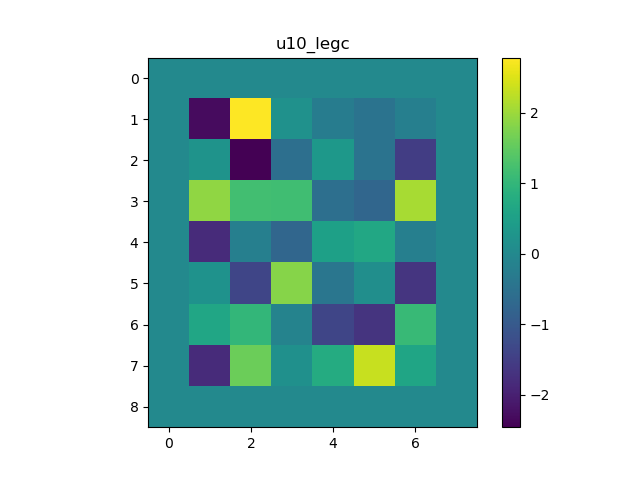

<IPython.core.display.Javascript object>


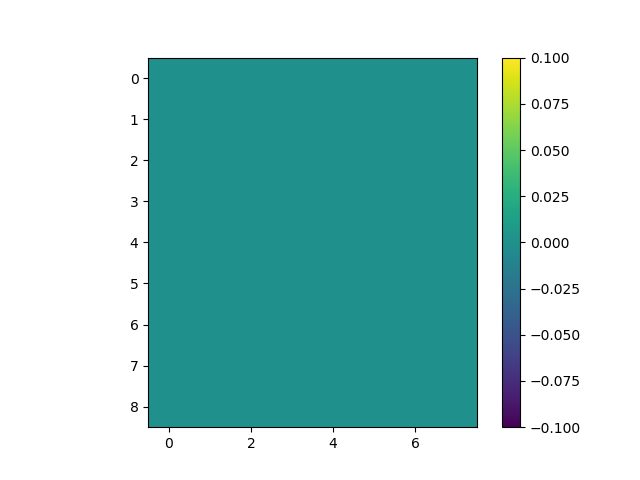

u10_numba time 8.028501179069281e-06 rel time factor 12.931230361215874
diff 2.781718 -2.4259129


<IPython.core.display.Javascript object>


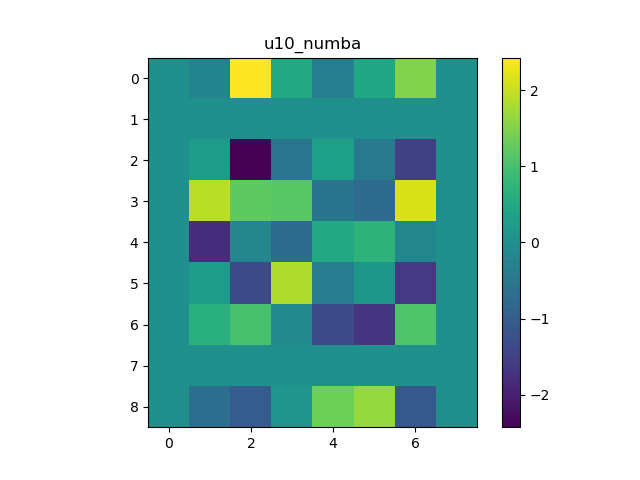

<IPython.core.display.Javascript object>


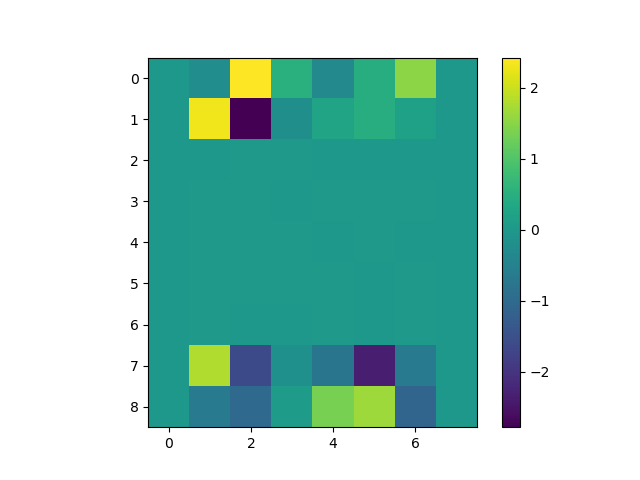

IndexError: index 8 is out of bounds for axis 1 with size 8

In [9]:
import time
Nx=8
Ny=8

hpad = np.array(10+np.random.rand(Nx+2, Ny+2),dtype=np.float32)
npad =  np.array(np.random.rand(Nx+2, Ny+2),dtype=np.float32)
f = np.zeros((Nx, Ny),dtype=np.float32)  

u =  np.array(np.random.rand(Nx+1, Ny),dtype=np.float32)
v =  np.array(np.random.rand(Nx, Ny+1),dtype=np.float32)
# dx =  np.array(3.1*np.ones((Nx, Ny)),dtype=np.float32)
# dy =  np.array(3.1*np.ones((Nx, Ny)),dtype=np.float32)
dx = 3.1
dy = 3.2
h = hpad[1:-1,1:-1].copy()
n = npad[1:-1,1:-1].copy()

u[0,:] = 0
u[-1,:] = 0
u[:,0] = 0
u[:,-1] = 0
v[0,:] = 0
v[-1,:] = 0
v[:,0] = 0
v[:,-1] = 0

# print (h)
uout = np.zeros((Nx+1, Ny),dtype=np.float32)
nout = np.zeros((Nx, Ny),dtype=np.float32)

nold = np.zeros((Nx, Ny),dtype=np.float32)

ch = nb.cuda.to_device(h)
cn = nb.cuda.to_device(n)
cu = nb.cuda.to_device(u)
cv = nb.cuda.to_device(v)
cout = nb.cuda.to_device(uout)
cnout = nb.cuda.to_device(nout)
cf = nb.cuda.to_device(f)


print ('dudt-cuda attrs ', dudt_drive_cuda._func.get().attrs)
gridx = ( (cout.shape[1]+32)//32,(cout.shape[0]+32)//32)
ngridx = ( (cnout.shape[1]+32)//32,(cnout.shape[0]+32)//32)

print ("grid",gridx)
# dudt_drive_cuda[gridx,(32,32)](ch, cn, cf,cu, cv, dx, dy, cout)
dudt_drive_numba(h, n, f, u, v, dx, dy, uout)  # warmup
uout[:] = cout.copy_to_host()

uold = np.zeros((Nx+1, Ny),dtype=np.float32)
dudt(h, n, f, u, v, dx, dy, uold)
nb.cuda.synchronize()
#dudt_drive_numba(h, n, f, u, v, dx, dy, uout)


def u10_numba():
    for i in range(10):
        dudt_drive_numba(h, n, f, u, v, dx, dy, uout)
    return uout



def u10_cuda():
    func = dudt_drive_cuda[gridx,(32,32)]
    print("x"*18)
    print(func)
    for i in range(10):
        
        func(ch, cn, cf,cu, cv, dx, dy, cout)
        
    nb.cuda.synchronize()
    return cout.copy_to_host()


def u10_legc():
    for i in range(10):
        dudt(h, n, f, u, v, dx, dy, uold)
    return uold


def n10_cuda():
    func = dndt_drive_cuda[ngridx,(32,32)]
    print('x'*18, func)
    for i in range(10):
        func(ch, cn, cu, cv, dx, dy, cnout)
    nb.cuda.synchronize()
    return cnout.copy_to_host()

def n10_legc():
    for i in range(10):
        dndt(h, n, u, v, dx, dy, nold)
    return nold



plt.figure(1)
plt.title('n-cuda')
plt.imshow(n10_cuda())
plt.colorbar()
plt.show()

plt.figure(2)
plt.title('n-legacy')
plt.imshow(n10_legc())
plt.colorbar()
plt.show()

plt.figure(3)
plt.title('n-cuda -legacy difference')
plt.imshow(n10_cuda()-n10_legc())
plt.colorbar()
plt.show()

for i,ff in enumerate((u10_legc,u10_numba,)):#u10_cuda,)):
    t = time.perf_counter()
    foo = ff()
    t = (time.perf_counter()-t)/10.0
    if (i==0): t0=t
    print (ff.__name__,'time',t,"rel time factor",t0/t)
    print ('diff',np.max(uold-foo), np.min(uold-foo))
    if (Nx*Ny<8194):
        plt.figure(4+i)
        plt.imshow(foo)
        plt.colorbar()
        plt.title(ff.__name__)
        plt.figure(14+i)
        plt.imshow(foo-uold)
        plt.colorbar()
plt.show()

#if (Nx*Ny<8194):
#    plt.figure(2)
#    plt.imshow(uold)
#    plt.figure(3)
#    plt.imshow(uout)
#    plt.figure(4)
#    plt.imshow(uold-uout)
#    plt.colorbar()
#%timeit foo_old()
#%timeit foo_numba()
#%timeit foo_cuda()




dndt(h, n, u, v, dx, dy, nold)
nnout = np.zeros((Nx, Ny))
dndt_drive_py(hpad, npad, u, v, dx, dy, nnout)
if (False):
    plt.figure(6)
    plt.imshow(nold)
    plt.figure(7)
    plt.imshow(nnout)
    plt.figure(8)

    print(nold.shape,nnout.shape)
    plt.imshow(nold-nnout)

    plt.colorbar()
print(np.max(nold-nnout),"\n", np.min(np.abs(nold-nnout)))    

# print(nold,"\n",nnout)
# print (nold-nnout)

In [10]:
def forward(h, n, u, v, f, dt, dx, dy, doland, coastx, borders, du, dv, dn, \
            beta=0, eps=0, gamma=0, mu=0.3, nu=0, \
            dudt_x=dudt, dvdt_x=dvdt, dndt_x=dndt, \
            grav=True, cori=True, advx=True, advy=True, attn=True): # forward euler and forward/backward timestep
    """
        beta = 0 forward euler timestep
        beta = 1 forward-backward timestep
    """
    beta = np.float32(beta)
    mu = np.float32(mu)
    
    du1, du0 = du[:2]
    dv1, dv0 = dv[:2]
    dn0 = dn[0]
    
    dndt_x(h, n, u, v, dx, dy, dn0) # calculate dndt and put it into dn0
    
    n1 = n + ( dn0 )*dt
    
    dudt_x(h, n,  f, u, v, dx, dy, du0, grav=grav, cori=cori, advx=advx, advy=advy, attn=attn,nu=nu,mu=mu)
    dvdt_x(h, n,  f, u, v, dx, dy, dv0, grav=grav, cori=cori, advx=advx, advy=advy, attn=attn,nu=nu,mu=mu)
    dudt_x(h, n1, f, u, v, dx, dy, du1, grav=grav, cori=cori, advx=advx, advy=advy, attn=attn,nu=nu,mu=mu)
    dvdt_x(h, n1, f, u, v, dx, dy, dv1, grav=grav, cori=cori, advx=advx, advy=advy, attn=attn,nu=nu,mu=mu)
    
    u1 = u + ( beta*du1 + (one-beta)*du0 )*dt
    v1 = v + ( beta*dv1 + (one-beta)*dv0 )*dt
    
    u1, v1 = doland(h, u1, v1, coastx) # handle any land in the simulation
    n1, u1, v1 = border(n1, u1, v1, 15, borders)
    return n1, u1, v1, (du1, du0, du0, du0), (dv1, dv0, dv0, dv0), (dn0, dn0, dn0)

def fbfeedback(h, n, u, v, f, dt, dx, dy, doland, coastx, borders, du, dv, dn, \
               beta=1/3, eps=2/3, gamma=0, mu=0.3, nu=0, \
               dudt_x=dudt, dvdt_x=dvdt, dndt_x=dndt, \
               grav=True, cori=True, advx=True, advy=True, attn=True):
    """
        predictor (forward-backward) corrector timestep
    """
    beta = np.float32(beta)
    eps = np.float32(eps)
    mu = np.float32(mu)
    
    du0, du1, du1g = du[:3]
    dv0, dv1, dv1g = dv[:3]
    dn0, dn1 = dn[:2]
    
    #predict
    n1g, u1g, v1g, dug, dvg, dng = forward(h, n, u, v, f, dt, dx, dy, doland, coastx, borders, du, dv, dn, beta, mu=mu, nu=nu,dudt_x=dudt_x, dvdt_x=dvdt_x, dndt_x=dndt_x, grav=grav, cori=cori, advx=advx, advy=advy, attn=attn) # forward-backward first guess
    
    #feedback on prediction
    
    dndt_x(h, n1g,u1g,v1g,dx, dy, dn1)
    dn0 = dng[0]
#     dndt_x(h, n,  u,  v,  dx, dy, dn0)
    
    n1 = n + p5*(dn1 + dn0)*dt
    
    du0 = dug[1]
    dv0 = dvg[1]
    #dudt_x(h, n,  f, u,  v,  dx, dy, du0, mu=mu, grav=grav, cori=cori, advx=advx, advy=advy, attn=attn)
    #dvdt_x(h, n,  f, u,  v,  dx, dy, dv0, mu=mu, grav=grav, cori=cori, advx=advx, advy=advy, attn=attn)
    dudt_x(h, n1g,f, u1g,v1g,dx, dy, du1g, grav=grav, cori=cori, advx=advx, advy=advy, attn=attn,nu=nu,mu=mu)
    dvdt_x(h, n1g,f, u1g,v1g,dx, dy, dv1g, grav=grav, cori=cori, advx=advx, advy=advy, attn=attn,nu=nu,mu=mu)
    dudt_x(h, n1, f, u,  v,  dx, dy, du1,  grav=grav, cori=cori, advx=advx, advy=advy, attn=attn,nu=nu,mu=mu)
    dvdt_x(h, n1, f, u,  v,  dx, dy, dv1,  grav=grav, cori=cori, advx=advx, advy=advy, attn=attn,nu=nu,mu=mu)

    u1 = u + p5*(eps*du1+(one-eps)*du1g+du0)*dt
    v1 = v + p5*(eps*dv1+(one-eps)*dv1g+dv0)*dt
    
    u1, v1 = doland(h, u1, v1, coastx) # how to handle land/coast
    n1, u1, v1 = border(n1, u1, v1, 15, borders)
    return n1, u1, v1, (du1, du0, du0, du0), (dv1, dv0, dv0, dv0), (dn0, dn0, dn0)

In [11]:
def init_genfb(u,v,n):
    print ("initialized generalizedFB dn")
    # wrong, should set all to initial derivative not zeros
    dn = ( np.zeros_like(n),np.zeros_like(n),np.zeros_like(n))
    du = ( np.zeros_like(u),np.zeros_like(u),np.zeros_like(u),np.zeros_like(u))
    dv = ( np.zeros_like(v),np.zeros_like(v),np.zeros_like(v),np.zeros_like(v))
    return du,dv,dn
    
# @nb.jit()

def genfb(h, n, u, v, f, dt, dx, dy, doland, coastx, bounds,\
          du,dv,dn,\
          beta=0.281105, eps=0.013, gamma=0.0880, mu=0.3, nu=0, \
          dudt_x=dudt, dvdt_x=dvdt, dndt_x=dndt, \
          grav=True, cori=True, advx=True, advy=True, attn=True): # generalized forward backward feedback timestep
    """
        generalized forward backward predictor corrector
    """
    
    p5=np.float32(0.5)
    p32 =np.float32(1.5)
    beta = np.float32(beta)
    eps = np.float32(eps)
    gamma = np.float32(gamma)
    mu = np.float32(mu)
    
    
#     for k in (h, n, u, v, f, dt, dx, dy, nu, coastx, bounds, du, dv, dn, mu, beta, eps, gamma):
#         print(k)


    #feedback on guess
#     if dn is None: 
#         du,dv,dn = init_genfb(u,v,n)
  
        
    dn_m1,dn_m2,dn_m0 = dn     # unpack
    dndt_x(h, n, u, v, dx, dy, dn_m0)
    
    # must do the following before the u and v !
    n1 = n + ((p32+beta)* dn_m0 - (p5+beta+beta)* dn_m1+ (beta)* dn_m2)*dt
    #del  dn_m2
    du_m0,du_m1,du_m2,du_p1 = du     # unpack
    dudt_x(h, n1, f, u, v, dx, dy, du_p1, grav=grav, cori=cori, advx=advx, advy=advy, attn=attn,nu=nu,mu=mu)

    dv_m0,dv_m1,dv_m2,dv_p1 = dv     # unpack   
    dvdt_x(h, n1, f, u, v, dx, dy, dv_p1, grav=grav, cori=cori, advx=advx, advy=advy, attn=attn,nu=nu,mu=mu)
   
        
    u1 = u+ ((p5+gamma+eps+eps)*du_p1 +(p5-gamma-gamma-eps-eps-eps)*du_m0 +gamma*du_m1+eps*du_m2)*dt
  # del du_m2
    v1 = v+ ((p5+gamma+eps+eps)*dv_p1 +(p5-gamma-gamma-eps-eps-eps)*dv_m0 +gamma*dv_m1+eps*dv_m2)*dt
   # del dv_m2

    u1, v1 = doland(h, u1, v1, coastx) # how to handle land/coast
    n1, u1, v1 = border(n1, u1, v1, 15, bounds)
    
    dv = ( dv_p1,dv_m0,dv_m1,dv_m2)
    du = ( du_p1,du_m0,du_m1,du_m2)
    dn = ( dn_m0,dn_m1,dn_m2)
    return n1, u1, v1, du,dv,dn

In [12]:
@nb.vectorize(['float32(float32,float32,float32,float32)'],target='cuda')
def lin_comb_2(v1, v2, w1, w2):
    return v1*w1 + v2*w2
# tc = nb.vectorize('float32(float32,float32,float32,float32)',target='cuda')
# lin_comb_2 = tc(lin_comb_2_py)
@nb.vectorize(['float32(float32,float32,float32,float32,float32,float32)'],target='cuda')
def lin_comb_3(v1, v2, v3, w1, w2, w3):
    return v1*w1 + v2*w2 + v3*w3
@nb.vectorize(['float32(float32,float32,float32,float32,float32,float32,float32,float32)'],target='cuda')
def lin_comb_4(v1, v2, v3, v4, w1, w2, w3, w4):
    return v1*w1 + v2*w2 + v3*w3 + v4*w4
@nb.vectorize(['float32(float32,float32,float32,float32,float32,float32,float32,float32,float32,float32)'],target='cuda')
def lin_comb_5(v1, v2, v3, v4, v5, w1, w2, w3, w4, w5):
    return v1*w1 + v2*w2 + v3*w3 + v4*w4 + v5*w5


@nb.numba.jit('void(float32[:,:],float32[:,:],float32,float32,float32[:,:])')
def lincomb2(v1, v2, w1, w2, out):
    out[:,:] = lin_comb_2(v1, v2, w1, w2)
@nb.numba.jit('void(float32[:,:],float32[:,:],float32[:,:],float32,float32,float32,float32[:,:])')
def lincomb3(v1, v2, v3, w1, w2, w3, out):
    out[:,:] = lin_comb_3(v1, v2, v3, w1, w2, w3)
@nb.numba.jit('void(float32[:,:],float32[:,:],float32[:,:],float32[:,:],float32,float32,float32,float32,float32[:,:])')
def lincomb4(v1, v2, v3, v4, w1, w2, w3, w4, out):
    out[:,:] = lin_comb_4(v1, v2, v3, v4, w1, w2, w3, w4)
@nb.numba.jit('void(float32[:,:],float32[:,:],float32[:,:],float32[:,:],float32[:,:],float32,float32,float32,float32,float32,float32[:,:])')
def lincomb5(v1, v2, v3, v4, v5, w1, w2, w3, w4, w5, out):
    out[:,:] = lin_comb_5(v1, v2, v3, v4, v5, w1, w2, w3, w4, w5)

In [13]:
# arr1 = np.asarray(np.random.rand(5, 5), dtype=np.float32)
# arr2 = np.random.rand(5, 5, dtype=np.float32)
arr1 = np.ones((5,5),dtype=np.float32)
arr2 = np.ones((5,5),dtype=np.float32)
arr3 = np.empty((5,5),dtype=np.float32)
devicearr1 = nb.cuda.to_device(arr1)
devicearr2 = nb.cuda.to_device(arr2)
devicearr3 = nb.cuda.to_device(arr3)
print (type(lin_comb_2(np.float32(0.0),arr1,np.float32(1.0),arr2)))
lincomb2(devicearr1, devicearr2, np.float32(1), np.float32(0.5), devicearr3)
print(type(devicearr3))
np.asarray(devicearr3)

<class 'numpy.ndarray'>
<class 'numba.cuda.cudadrv.devicearray.DeviceNDArray'>


array([[1.5, 1.5, 1.5, 1.5, 1.5],
       [1.5, 1.5, 1.5, 1.5, 1.5],
       [1.5, 1.5, 1.5, 1.5, 1.5],
       [1.5, 1.5, 1.5, 1.5, 1.5],
       [1.5, 1.5, 1.5, 1.5, 1.5]])

In [14]:
# @nb.cuda.jit(fastmath=True)
def genfb_py(h, n, u, v, f, dt, dx, dy, doland, coastx, bounds,\
          du,dv,dn,\
          beta=0.281105, eps=0.013, gamma=0.0880, mu=0.3, nu=0, \
          dudt_x=dudt, dvdt_x=dvdt, dndt_x=dndt, \
          grav=True, cori=True, advx=True, advy=True, attn=True): # generalized forward backward feedback timestep
    """
        generalized forward backward predictor corrector
    """
    
    p5   = np.float32(0.5)
    one  = np.float32(1)
    p32  = np.float32(1.5)
    beta = np.float32(beta)
    eps  = np.float32(eps)
    gamma= np.float32(gamma)
    mu   = np.float32(mu)
    
    dn_m1,dn_m2,dn_m0 = dn[0], dn[1], dn[2]     # unpack
    dndt_x(h, n, u, v, dx, dy, dn_m0)
    
    # must do the following before the u and v !
    #n1 = n + ((p32+beta)* dn_m0 - (p5+beta+beta)* dn_m1+ (beta)* dn_m2)*dt
    lincomb4(n, dn_m0, dn_m1, dn_m2, one, (p32+beta)*dt, -(p5+beta+beta)*dt, (beta)*dt, n)
    
    du_m0,du_m1,du_m2,du_p1 = du[0], du[1], du[2], du[3]     # unpack
    dudt_x(h, n, f, u, v, dx, dy, du_p1, grav, cori, advx, advy, attn,nu,mu)

    dv_m0,dv_m1,dv_m2,dv_p1 = dv[0], dv[1], dv[2], dv[3]     # unpack   
    dvdt_x(h, n, f, u, v, dx, dy, dv_p1, grav, cori, advx, advy, attn,nu,mu)
    
    #u1 = u+ ((p5+gamma+eps+eps)*du_p1 +(p5-gamma-gamma-eps-eps-eps)*du_m0 +gamma*du_m1+eps*du_m2)*dt
    lincomb5(u, du_p1, du_m0, du_m1, du_m2, one, (p5+gamma+eps+eps)*dt, (p5-gamma-gamma-eps-eps-eps)*dt, gamma*dt, eps*dt, u)
    #v1 = v+ ((p5+gamma+eps+eps)*dv_p1 +(p5-gamma-gamma-eps-eps-eps)*dv_m0 +gamma*dv_m1+eps*dv_m2)*dt
    lincomb5(v, dv_p1, dv_m0, dv_m1, dv_m2, one, (p5+gamma+eps+eps)*dt, (p5-gamma-gamma-eps-eps-eps)*dt, gamma*dt, eps*dt, v)

    
    #u, v = 
    doland(h, u, v, coastx) # how to handle land/coast
#     border(n, u, v, 15, bounds)
    
    dv = ( dv_p1,dv_m0,dv_m1,dv_m2)
    du = ( du_p1,du_m0,du_m1,du_m2)
    dn = ( dn_m0,dn_m1,dn_m2)
    return n, u, v, du,dv,dn

In [15]:
# def timestep(h, n, u, v, f, dt, dx, dy, nu, coastx, bounds, mu):
#     return fbfeedback(h, n, u, v, f, dt, dx, dy, nu, land, coastx, bounds, mu) # switch which integrator/timestep is in use
# def timestep(state): return fbfeedback(state, land) # which integrator/timestep is in use

#

In [16]:
def returnnuv (h, n, u, v, f, dt, dx, dy, nu, coastx, bounds, mu, itr): return n, u, v

In [17]:
def simulate(initstate, t, timestep=forward, nttname = False, landthresh=15, \
             bounds = [1, 1, 1, 1], saveinterval=10,\
             drive=returnnuv, \
             beta=0.281105, eps=0.013, gamma=0.0880, mu=0.3, nu=0, \
             dudt_x=dudt, dvdt_x=dvdt, dndt_x=dndt, \
             grav=True, cori=True, advx=True, advy=True, attn=True): # gives surface height array of the system after evert dt
    """
        evolve shallow water system from initstate over t seconds
        returns:
            ntt (numpy memmap of n through time) numpy array,
            maxn (the maximum value of n over the duration at each point) numpy array,
            minn (the minimum value of n over the duration at each point) numpy array,
            timemax (the number of seconds until the maximum height at each point) numpy array
    """
    bounds = np.asarray(bounds, dtype=np.float32)
    h, n, u, v, f, dx, dy, dt = [initstate.__dict__[k] for k in ('h', 'n', 'u', 'v', 'coriolis', 'dx', 'dy', 'dt')]#h, state.n, state.u, state.v, state.dx, state.dy, state.dt
    
#     h[np.logical_and(np.greater(h, -0.1), np.less(h, 0.2))] = np.float32(0.1)
    
    du = np.zeros_like(u)
    dv = np.zeros_like(v)
    dn = np.zeros_like(n)
    
    dudt_x(h, n, f, u, v, dx, dy, du)
    du = (du, du, du, du)
    
    dvdt_x(h, n, f, u, v, dx, dy, dv)
    dv = (dv, dv, dv, dv)
    
    dndt_x(h, n, u, v, dx, dy, dn)
    dn = (dn, dn, dn)
    
    nu = (dx+dy)/1000
    #     state = initstate
    mmax = np.max(np.abs(n))
    landthresh = landthresh # threshhold for when sea ends and land begins
    itrs = int(np.ceil(t/dt))
    saveinterval = np.int(saveinterval//dt)
    assert (dt >= 0), 'negative dt!' # dont try if timstep is zero or negative
    
#     ntt = np.memap(str(nttname)+'_eed', dtype='float32', mode='w+', shape=(itrs,)+n.shape)
    ntt = np.zeros((np.int(np.ceil(itrs/saveinterval)),)+n.shape, dtype=np.float32)
    maxn = np.zeros(n.shape, dtype=n.dtype) # max height in that area
#     minn = np.zeros(n.shape, dtype=n.dtype) # minimum height that was at each point
#     timemax = np.zeros(n.shape, dtype=n.dtype) # when the maximum height occured
    
    coastx = np.less(h, landthresh) # where the reflective condition is enforced on the coast
    
    
    
    print('simulating...')
    try:
        for itr in range(itrs):# iterate for the given number of iterations
            if itr%saveinterval == 0:
                ntt[np.int(itr/saveinterval),:,:] = n
            
            maxn = np.max((n, maxn), axis=0) # record new maxes if they are greater than previous records        
            
            n, u, v, du, dv, dn = timestep(h, n, u, v, f, dt, dx, dy, land, coastx, bounds, \
                                           du, dv, dn, beta=beta, eps=eps, gamma=gamma, mu=mu, nu=nu, \
                                           dudt_x=dudt_x, dvdt_x=dvdt_x, dndt_x=dndt_x, \
                                           grav=grav, cori=cori, advx=advx, advy=advy, attn=attn) # pushes n, u, v one step into the future
           
        print('simulation complete')
    except Exception as e:
        print('timestep: ', itr)
        raise e
    return ntt, maxn#, minn, timemax # return surface height through time and maximum heights

In [18]:
def simulate_cuda(initstate, t, timestep=genfb_py, nttname = False, \
             bounds = [1, 1, 1, 1], saveinterval=10,\
             drive=returnnuv, \
             beta=0.281105, eps=0.013, gamma=0.0880, mu=0.3, nu=0, \
             dudt_x=dudt, dvdt_x=dvdt, dndt_x=dndt, \
             grav=True, cori=True, advx=True, advy=True, attn=True): # gives surface height array of the system after evert dt
    """
        evolve shallow water system from initstate over t seconds
        returns:
            ntt (n through time) np.memmap,
            maxn (the maximum value of n over the duration at each point) np.array,
            #minn (the minimum value of n over the duration at each point) np.array,
            #timemax (the number of seconds until the maximum height at each point) np.array
    """
    print("simulate start")
    bounds = np.asarray(bounds, dtype=np.float32)
    h, n, u, v, f, dx, dy, dt = [initstate.__dict__[k] for k in ('h', 'n', 'u', 'v', 'coriolis', 'dx', 'dy', 'dt')]#h, state.n, state.u, state.v, state.dx, state.dy, state.dt
    
#     h[np.logical_and(np.greater(h, -0.1), np.less(h, 0.2))] = np.float32(0.1)

    
    du = np.zeros_like(u)
    dv = np.zeros_like(v)
    dn = np.zeros_like(n)
   
    dndt_x(h, n, u, v, dx, dy, dn)
    dn = (dn, dn.copy(), dn.copy())
    
    dudt_x(h, n, f, u, v, dx, dy, du)
    du = (du, du.copy(), du.copy(), du.copy())
    
    dvdt_x(h, n, f, u, v, dx, dy, dv)
    dv = (dv, dv.copy(), dv.copy(), dv.copy())
    
    
    
    nu = (dx+dy)/1000
    #     state = initstate
    mmax = np.max(np.abs(n))
    landthresh = 1.5*np.max(n) # threshhold for when sea ends and land begins
    itrs = int(np.ceil(t/dt))
    
    saveinterval = np.int(saveinterval//dt)
    assert (dt >= 0), 'negative dt!' # dont try if timstep is zero or negative
    
    ntt = np.zeros((np.int(np.ceil(itrs/saveinterval)),)+n.shape, dtype=np.float32)
#     ntt = np.memmap(str(nttname)+'_eed', dtype='float32', mode='w+', shape=(itrs,)+n.shape)
    maxn = np.zeros(n.shape, dtype=n.dtype) # max height in that area
#     minn = np.zeros(n.shape, dtype=n.dtype) # minimum height that was at each point
#     timemax = np.zeros(n.shape, dtype=n.dtype) # when the maximum height occured
    
    coastx = np.less(h, landthresh) # where the reflective condition is enforced on the coast
#     print('coastx', coastx)
    coastx = np.float32(coastx)
    
    
    ch     = nb.cuda.to_device(h)
    cn     = nb.cuda.to_device(n)
    cu     = nb.cuda.to_device(u)
    cv     = nb.cuda.to_device(v)
#     cout = nb.cuda.to_device(uout)
#     cnout = nb.cuda.to_device(nout)
    cf     = nb.cuda.to_device(f)
    ccoastx= nb.cuda.to_device(coastx)
    cmaxn  = nb.cuda.to_device(maxn)
    cdu    = tuple( [ nb.cuda.to_device(i) for i in du])
    cdv    = tuple( [ nb.cuda.to_device(i) for i in dv])
    cdn    = tuple( [ nb.cuda.to_device(i) for i in dn])
    print("cdn",cdn)
    print("cdn1",cdn[1])
#     cntt = nb.cuda.to_device(ntt)
    
    gridu = ( (cu.shape[1]+32)//32,(cu.shape[0]+32)//32)
    gridv = ( (cv.shape[1]+32)//32,(cv.shape[0]+32)//32)
    gridn = ( (cn.shape[1]+32)//32,(cn.shape[0]+32)//32)
    
    dudt_x = dudt_drive_cuda[gridu,(32,32)]
    dvdt_x = dvdt_drive_cuda[gridv,(32,32)]
    dndt_x = dndt_drive_cuda[gridn,(32,32)]
    
    land   =   land_cuda[gridn,(32,32)]
    border = border_cuda[gridn,(32,32)]
    
    nb.cuda.synchronize()
    print('simulating...')
    try:
        for itr in range(itrs):# iterate for the given number of iterations
#             if itr%saveinterval == 0:
#                 ntt[np.int(itr/saveinterval),:,:] = cn
            
            cn, cu, cv, cdu, cdv, cdn = timestep(ch, cn, cu, cv, cf, dt, dx, dy, land, ccoastx, bounds,\
                                              cdu,cdv,cdn,\
                                              0.281105, 0.013, 0.0880, 0.3, 0, \
                                              dudt_x, dvdt_x, dndt_x, \
                                              grav, cori, advx, advy, attn) # pushes n, u, v one step into the future
            if itr%100 == 0: 
                print(cdn)
                print(cn)
#             if not nttname == False:
#                 cntt[itr] = cn
#             border(cn, cu, cv)
#             cmaxn = nb.max((cn, cmaxn), axis=0) # record new maxes if they are greater than previous records        
#         ntt.flush()
        print('simulation complete')
    except Exception as e:
        print('timestep: ', itr)
        raise e
    return ntt, maxn#, minn, timemax # return surface height through time and maximum heights

# verification

simulating...
simulation complete


<IPython.core.display.Javascript object>


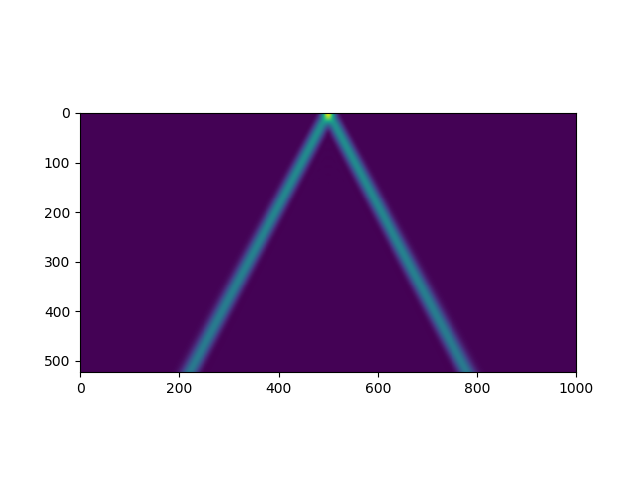

<IPython.core.display.Javascript object>


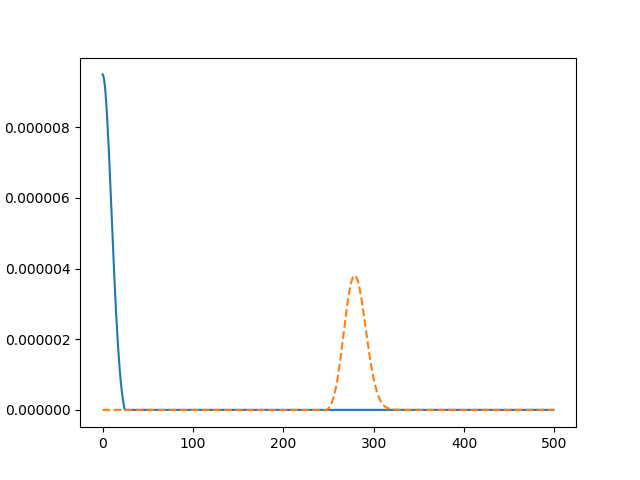

.

279.0 313.2091952673165
-0.10922155474432915 0.11


.
----------------------------------------------------------------------
Ran 2 tests in 1.531s

OK


In [19]:
#wavespeed and differential tests
import unittest
fooo = []
class testWaveSpeed(unittest.TestCase): # tests if the wave speed is correct
    def setUp(self):
        self.dur = 100 # duration of period to calculate speed over
        self.size = (10, 1000) # grid squares (dx's)
        self.dx = np.single(100, dtype=np.float32) # meters
        self.dy = np.single(100, dtype=np.float32)
        self.lat = np.linspace(0, 0, self.size[0]) # physical location the simulation is over
        self.lon = np.linspace(0, 0 , self.size[1])
        self.h = np.float32(10000*np.ones(self.size))
        self.n = 0.00001*lingauss(self.size, 10, cy=500, theta=np.pi/2) # intial condition single wave in the center
        self.u = np.zeros((self.size[0]+1, self.size[1]+0)) # x vel array
        self.v = np.zeros((self.size[0]+0, self.size[1]+1)) # y vel array
        self.margin = 0.11 # error margin of test
        self.testStart = State(self.h, self.n, self.u, self.v, self.dx, self.dy, self.lat, self.lon)
    def calcWaveSpeed(self, ar1, ar2, Dt): # calculat how fast the wave is propagating out
        midstrip1 = ar1[int(ar1.shape[0]/2),int(ar1.shape[1]/2):]
        midstrip2 = ar2[int(ar1.shape[0]/2),int(ar2.shape[1]/2):]
        peakloc1 = np.argmax(midstrip1)
        peakloc2 = np.argmax(midstrip2)
        plt.figure(6)
        plt.clf()
#         plt.subplot(2, 1, 1)
#         plt.imshow(ar1)
#         plt.subplot(2, 1, 2)
#         plt.imshow(ar2)
        plt.plot(midstrip1)
        plt.plot(midstrip2, "--")
#         plt.plot(midstrip1-midstrip2)
        plt.show()
        speed = (peakloc2 - peakloc1)*self.dy/Dt
        return speed
    def calcExactWaveSpeed(self): # approximently how fast the wave should be propagating outwards
        ws = np.sqrt(9.81*np.average(self.h))
        return ws
    def test_wavespeed(self): # test if the expected and calculated wave speeds line up approcimently
        
        self.simdata = simulate(self.testStart, self.dur, saveinterval=0.2, \
                                timestep=fbfeedback, bounds=np.array([1, 1, 1, 1]), mu=0, cori=False, advx=False, advy=False, attn=False)
#         self.testFrames, self.testmax, self.testmin = self.simdata[:3]
        fig = plt.figure(7)
        plt.imshow(self.simdata[0][:,5])#self.testStart.n)
#         arts = [(plt.imshow(frame),) for frame in self.simdata[0]]
#         anim = animation.ArtistAnimation(fig, arts)
        
        self.testFrames = self.simdata[0]
        self.testEndN = self.testFrames[-1]
        calcedws = self.calcWaveSpeed( self.testStart.n, self.testEndN, self.dur )
        exactws = self.calcExactWaveSpeed()
        err = (calcedws - exactws)/exactws
        print(calcedws, exactws)
        print(err, self.margin)
        
        assert (abs(err) < self.margin) # error margin
    def tearDown(self):
        del(self.dur)
        del(self.dx)
        del(self.dy)
        del(self.lat)
        del(self.lon)
        del(self.size)
        del(self.h)
        del(self.n)
        del(self.u)
        del(self.v)

class testdifferential(unittest.TestCase): # differental function test (d_dx)
    def setUp(self):
        self.a = np.arange(144) # test input
        self.a = self.a.reshape(12, 12) # make into 2d array
        self.ddthreshold = 1E-16
    def test_ddx(self):
        da = d_dx(self.a, 1)
        diff = np.abs(da[1:-1] - np.mean(da[1:-1]))
        maxdiff = np.max(diff)
        self.assertTrue(np.all(np.abs(da[-1:1] < self.ddthreshold)),"expected zero along borders")
        self.assertTrue(np.all(diff < self.ddthreshold),"Expected constant d_dx less than %f but got %f"%(self.ddthreshold,maxdiff))
    def tearDown(self):
        del(self.a)
        del(self.ddthreshold)

unittest.main(argv=['first-arg-is-ignored'], exit=False)
#You can pass further arguments in the argv list, e.g.
#unittest.main(argv=['ignored', '-v'], exit=False)      
#unittest.main()

In [20]:
sizex, sizey = 2000, 2000
simpletestcase = {
    'h': np.float32(1000)*np.ones((sizex, sizey), dtype=np.float32),
    'n': planegauss((sizex, sizey), 10, 10, 60, 120),
    'u': np.zeros((sizex+1, sizey)),
    'v': np.zeros((sizex, sizey+1)),
    'dx': np.float32(100),
    'dy': np.float32(100),
    'lat': np.zeros((sizex,)),
    'lon': np.zeros((sizey,))
}

simpleState = State(**simpletestcase)
print(simpleState.dx, simpleState.dy, simpleState.h+simpleState.n)

100.0 100.0 [[1000. 1000. 1000. ... 1000. 1000. 1000.]
 [1000. 1000. 1000. ... 1000. 1000. 1000.]
 [1000. 1000. 1000. ... 1000. 1000. 1000.]
 ...
 [1000. 1000. 1000. ... 1000. 1000. 1000.]
 [1000. 1000. 1000. ... 1000. 1000. 1000.]
 [1000. 1000. 1000. ... 1000. 1000. 1000.]]


In [21]:
import time
t1 = time.time()
simpleframes, simpleMax = simulate(simpleState, 15, timestep=genfb, saveinterval=2,\
                                           dudt_x = dudt_drive_numba, dvdt_x = dvdt_drive_numba, dndt_x = dndt_drive_numba, \
                                           bounds=[0.95, 0.95, 0.95, 1], nttname='smp')[:2]
t2 = time.time()
simpleframes, simpleMax = simulate_cuda(simpleState, 15, timestep=genfb_py, saveinterval=2,\
                                           dudt_x = dudt_drive_numba, dvdt_x = dvdt_drive_numba, dndt_x = dndt_drive_numba, \
                                           bounds=[0.95, 0.95, 0.95, 1], nttname='smp')[:2]
t3=time.time()

print(t2-t1, t3-t2)

simulating...


KeyboardInterrupt: 

<IPython.core.display.Javascript object>


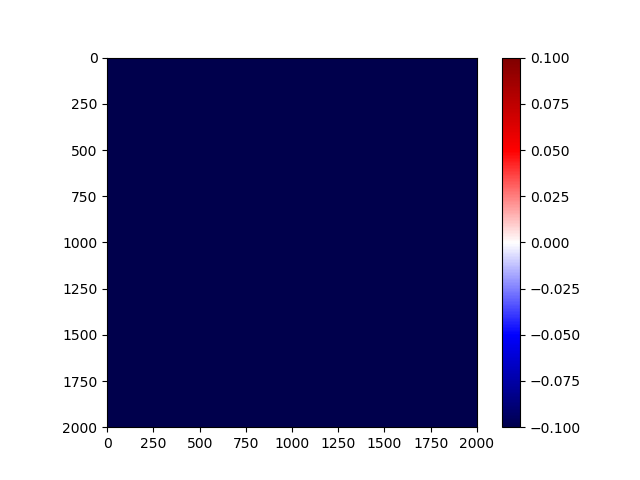

<IPython.core.display.Javascript object>


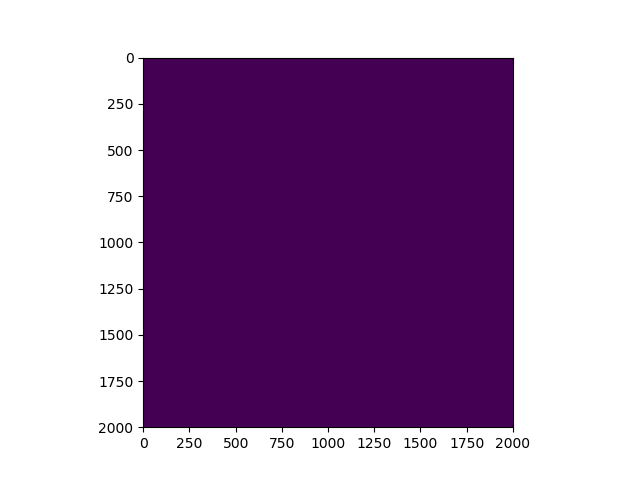

In [22]:
fig = plt.figure(25)
mmax = np.max(np.abs(simpleframes))/2
simpleart = [(plt.imshow(simplef, vmin=-mmax, vmax=mmax, cmap='seismic'),) for simplef in simpleframes]
anim = animation.ArtistAnimation(fig, simpleart, interval=50, blit=True, repeat_delay=200)
plt.colorbar()
# anim.save('../results/simpleplop.mp4')
plt.show()
fig = plt.figure(27)
plt.imshow(simpleMax)

In [29]:
%timeit simulate(simpleState, 100, timestep=genfb, \
                 dudt_x = dudt_drive_numba, dvdt_x = dvdt_drive_numba, dndt_x = dndt_drive_numba, \
                 bounds=[0.95, 0.95, 0.95, 1], savecount=2)[:2]
%timeit simulate(simpleState, 100, timestep=fbfeedback, \
                 dudt_x = dudt_drive_numba, dvdt_x = dvdt_drive_numba, dndt_x = dndt_drive_numba, \
                 bounds=[0.95, 0.95, 0.95, 1], savecount=2)[:2]
%timeit simulate(simpleState, 100, timestep=forward, \
                 dudt_x = dudt_drive_numba, dvdt_x = dvdt_drive_numba, dndt_x = dndt_drive_numba, \
                 bounds=[0.95, 0.95, 0.95, 1], savecount=2)[:2]

TypeError: simulate() got an unexpected keyword argument 'savecount'

In [ ]:
csimpleframes, csimpleMax = simulate_cuda(simpleState, 100, timestep=genfb_py, \
                                   bounds=[0.95, 0.95, 0.95, 1], nttname='smp')[:2]

In [ ]:
fig = plt.figure(28)
mmax = np.max(np.abs(csimpleframes))/2
csimpleart = [(plt.imshow(csimplef, vmin=-mmax, vmax=mmax, cmap='seismic'),) for csimplef in csimpleframes[::5]]
anim = animation.ArtistAnimation(fig, csimpleart, interval=50, blit=True, repeat_delay=200)
plt.colorbar()
anim.save('../results/cuda-simpleplop.mp4')
plt.show()
fig = plt.figure(29)
plt.imshow(csimpleMax)

In [ ]:
fig = plt.figure(25)
mmax = np.max(np.abs(sframes2))/2
simpleart = [(plt.imshow(simplef, vmin=-mmax, vmax=mmax, cmap='seismic'),) for simplef in sframes2[::5]]
anim = animation.ArtistAnimation(fig, simpleart, interval=50, blit=True, repeat_delay=200)
anim.save('../results/simpleplop2.mp4')
plt.colorbar()
plt.show()


In [ ]:
friccase = {
    'h': 1000*np.ones((100, 100), dtype=np.float),
    'n': planegauss((100, 100), 10, 10),
    'u': np.zeros((101, 100)),
    'v': np.zeros((100, 101)),
    'dx': 100,
    'dy': 100,
    'lat': np.zeros((100,)),
    'lon': np.zeros((100,))
}
fricState = State(**friccase)

In [ ]:
fricframes = simulate(fricState, 100)[0]#, simpleMax, simpleMin, simpleAT
nofricframes = simulate(fricState, 100, mu=0.0)[0]
# fig = plt.figure(23)
# plt.imshow(simpleframes[50])v

In [ ]:
fig = plt.figure(25)
fricdif = (fricframes-nofricframes)/(np.abs(fricframes)+np.abs(nofricframes)+1E-10)
fricart = [(plt.imshow(fricf, vmin=np.min(fricdif), vmax=np.max(fricdif)),) for fricf in fricdif]
anim = animation.ArtistAnimation(fig, fricart, interval=50, blit=True, repeat_delay=0)
plt.colorbar()
plt.show()
print(np.mean(fricdif))

In [ ]:
slope = {
    'h': np.pad(np.linspace(5000, 5, 800)[:,np.newaxis], ((50, 50), (1, 1)), mode='edge'),
    'n': np.zeros((900, 3)),#planegauss((200, 200), 10, 10, 50, 50),
    'u': np.zeros((901, 3)),
    'v': np.zeros((900, 4)),
    'dx': 40,
    'dy': 40,
    'lat': np.zeros((900,)),
    'lon': np.zeros((900,))
}
print(slope['h'].shape)
slopeState = State(**slope)

In [ ]:
plt.figure(29, figsize=(5, 2))
plt.plot(-slopeState.h[:,1])
plt.plot()
# plt.colorbar()
plt.show()

In [ ]:
def driver(h, n, u, v, f, dt, dx, dy, nu, coastx, bounds, mu, itr):
    n[0] = np.sin(itr*dt/8)[np.newaxis]
#     u[0] = np.cos(itr*dt/10)[np.newaxis]
    return n, u, v
slopeframes, slopeMax = simulate(slopeState, 500, bounds=np.array([1, 0.95, 1, 1]), drive=driver)[0:2]#, simpleMax, simpleMin, simpleAT

In [ ]:
fig = plt.figure(30)
mmax = np.max(np.abs(slopeframes))/2
slopeart = [(plt.imshow(slopef, vmin=-2, vmax=2, cmap='seismic'),) for slopef in slopeframes[::5]]
anim = animation.ArtistAnimation(fig, slopeart, interval=20, blit=True, repeat_delay=200)
plt.colorbar()
plt.show()

# fig = plt.figure(29)
# plt.imshow(slopeMax)

In [ ]:
mmax = np.max(np.abs(slopeframes))/2

fig, ax = plt.subplots()

x = np.arange(0, slopeframes.shape[1])
line, = ax.plot(x,slopeframes[0][:,1])
ax.plot(-slopeState.h[:,1])
# ax.fill_between(x, -2000, slopeframes[0][:,100], color='blue')
ax.fill_between(x, -5100, -slopeState.h[:,1], color='orange')
plt.ylim(-5100, 2000)
ax.set_xticks([],[])
ax.set_yticks([],[])

def init():  # only required for blitting to give a clean slate.
    line.set_ydata([np.nan] * len(x))
    return line,


def animate(i):
    line.set_ydata(1000+450*slopeframes[5*i][:,1])  # update the data.
#     ax.fill_between(x, 0, slopeframes[2*i][:,100], color='blue')
    return line,

ani = animation.FuncAnimation(
    fig, animate, init_func=init, interval=5, blit=True, save_count=2500, repeat=True, repeat_delay=500)
ani.save('../results/waveramp.mp4')
plt.show()

# indonesian tsunami

In [ ]:

class indone2004():
    event = {
        'lat': 3.316,
        'lon': 95.854
    } # source of the tsunami
    
    dlat = 111000 # latitude degree to meters
    psize = (dlat*30*np.cos(22.5*np.pi/180), dlat*15) # physical size of area
    size = (2500, 1250) # grid squares (dx) # lat, lon

    dx = np.single(psize[0]/size[0], dtype=np.float32) # meters
    dy = np.single(psize[1]/size[1], dtype=np.float32) # meters

    
    bath = nc.Dataset('../data/bathymetry.nc','r')
    
    rxy = (8, 16)
    lat = bath.variables['lat'][:]#[latin]
    lon = bath.variables['lon'][:]
    latr = (np.abs(lat-event['lat']+rxy[1]).argmin(), np.abs(lat-event['lat']-rxy[1]).argmin())
    lonr = (np.abs(lon-event['lon']+rxy[0]).argmin(), np.abs(lon-event['lon']-rxy[0]).argmin())
    latin = np.linspace(latr[0], latr[1], size[0], dtype=int)
    lonin = np.linspace(lonr[0], lonr[1], size[1], dtype=int) # indexes of the bathymetry dataset we need
    lat = bath.variables['lat'][latin]
    lon = bath.variables['lon'][lonin]
    h = np.asarray(-bath.variables['elevation'][latin, lonin], dtype=np.float32)

    n = np.zeros(size)

    evinlat = np.argmin(np.abs(lat - event['lat']))
    evinlon = np.argmin(np.abs(lon - event['lon'])) # the index of the closest value to the correct longitude
    rady = 1+2*(int(25000/dy)//2) # number of indicies across the disturbance is
    radx = 1+2*(int(25000/dx)//2) # modified to be odd, so a point lands on the max of the gaussian
#     evpatch = \

#     evpatch = \
    n[evinlat-rady:evinlat+rady, evinlon-radx:evinlon+radx] = \
    50*planegauss((2*rady, 2*radx))

    u = np.zeros((size[0]+1, size[1]+0))
    v = np.zeros((size[0]+0, size[1]+1))

indonesia = State(*(props(vars(indone2004))))

In [ ]:
seasurface = indonesia.n #np.empty(qp.asnumpy(indonesia.n).shape)
# seasurface[::-1] = qp.asnumpy(indonesia.n)
bathymetry = -indonesia.h


plt.figure(116)
plt.title('initial conditions of indonesia simulation')

# plt.subplot(121)
a1 = plt.imshow(seasurface, cmap='seismic', vmin=-np.max(seasurface), vmax=np.max(seasurface))
tt1 = plt.title('initial sea surface height')
cb1 = plt.colorbar()
cb1.set_label('sea surface height (m)')

# plt.subplot(222)
a2 = plt.contour(-bathymetry, cmap='Greys')
tt2 = plt.title('bathymetry')
# cb2 = plt.colorbar()
# cb2.set_label('ocean depth (m)')

# plt.subplot(122)
# # a3 = vect()
# tt3 = plt.title('inital velocity (m/s)')


In [ ]:
indosim = simulate(indonesia, 2500)
indot = indosim[0]
maxindo = indosim[1]
minindo = indosim[2]
tmindo = indosim[3]

masq = np.zeros(qp.asnumpy(indonesia.h).shape, dtype=qp.asnumpy(indonesia.h).dtype)
runuplocs = np.array([(5.251, 95.253), (5.452, 95.242), (5.389, 95.960), (2.575, 96.269), (4.208, 96.040)])
radx = masq.shape[0]//100
rady = masq.shape[1]//100
for runuploc in runuplocs:
    arglat, arglon = np.argmin(np.abs(indonesia.lat-runuploc[0])), np.argmin(np.abs(indonesia.lon-runuploc[1])) # gat the index location of this event
    masq[arglat-radx:arglat+radx, arglon-rady:arglon+rady] = 1 # make a small blip around the locatoin

plt.figure(123)
plt.contour(masq)
plt.show()

In [ ]:
# shallowWater/data/2004indonesiarunups.txt

In [ ]:
indof = np.transpose(indot, (0, 1, 2))
print(indof.shape)
maxt = np.max(indof,axis=(1,2))
print(maxt.shape)
imaxt = np.float32(1.0/maxt)
# plt.figure(888)
# plt.semilogy(maxt)
# plt.show()
norm_indof = indof*imaxt[:,np.newaxis,np.newaxis]

h = indonesia.h
# ht = np.transpose(h)
ht = h

In [ ]:
fig = plt.figure(122)

# plt.subplot(1, 3, 1)
plt.title('movie')
# f = genframes(norm_indof*0.3, frames=np.linspace(0, norm_indof.shape[0]-1, 300, dtype=int))
indoArts = [(plt.imshow(normindoframe, cmap='seismic', vmin=-np.max(normindoframe), vmax=np.max(normindoframe)),) for normindoframe in norm_indof]
indoAnim = animation.ArtistAnimation(fig, indoArts)
cb = plt.colorbar()
cbtt = cb.set_label('sea surface height (m)')


coast = plt.contour(ht, colors='black', levels=1)#, levels=3)
# locmask = plt.contour(masq, colors='green', levels=2)

In [ ]:
fig = plt.figure(124)
plt.title('maximum')
plt.imshow(maxindo+1, cmap='seismic', norm=mpl.colors.LogNorm())
# plt.colorbar()
plt.contour(ht-20, colors='black', levels=1)

In [ ]:
fig = plt.figure(126)
plt.title('minimum')
plt.imshow(1-minindo, cmap='seismic', norm=mpl.colors.LogNorm())
    # plt.colorbar()
plt.contour(ht-20, colors='black', levels=1)

plt.show()

# comparing indonesia sim to real data

In [ ]:
import pandas as pd

ff = pd.read_csv('~rrs/shallowWater/data/2004indonesiarunups2.txt',sep='\t')
#with open('~rrs/shallowWater/data/2004indonesiarunups.txt','r') as f:
#     txt = f.read()
ff   

In [ ]:
# includes the whole world
allruns = pd.read_csv('~rrs/shallowWater/data/al2004indorunups2.txt', sep='\t')
allruns = allruns.dropna(how='any',subset=['Latitude', 'Longitude', 'TTHr', 'TTMin', 'MaxWaterHeight'])
allruns = allruns.loc[:,['Latitude','Longitude','MaxWaterHeight','DistanceFromSource','TTHr','TTMin','Name']]

In [ ]:
# import data from file
indorut = pd.read_csv('~rrs/shallowWater/data/2004indonesiarunups2.txt',sep='\t')
indoevents = list(indorut.transpose().to_dict().values()) # list of dicts of events' properties
indoevents

In [ ]:
# sort the events by proximity to the source
# indoevents.sort(key = lambda event: np.sqrt((indone2004.event['lat'] - event['Latitude'])**2 + (indone2004.event['lat'] - event['Longitude'])**2))
indoevents.sort(key = lambda event: event['DistanceFromSource'])

In [ ]:
# simindomaxh = np.array([], dtype=np.float32) # the list of the maximum height that occured at each location
# for event in indoevents: # get the maximum water height at each location in the sim in the order given to us
# #     print(event)
#     evlat = event['Latitude'] # the latitude of the measurement
#     evlon = event['Longitude'] # "  longitude " "       "
#     argevlat = np.argmin(np.abs(indonesia.lat-evlat)) # the array index with latitude closest to point
#     argevlon = np.argmin(np.abs(indonesia.lon-evlon)) # the array index with longitude closest to point
#     mh = maxindo[argevlat, argevlon] # the maximum height at this point
#     if (argevlat == 0 or argevlon == 0): # if the point is out of the map so it just returns the edge
#         mh = 0 # ignore the value at the edge 
#     simindomaxh = np.append(simindomaxh, mh)

# list of indexes maximum height at the location of each event
# simindomaxh = [np.max(\
#                       maxindo[\
#                               np.argmin(np.abs(indonesia.lon-event['Longitude'])), \
#                               np.argmin(np.abs(indonesia.lat-event['Latitude']))]) \
#                for event in indoevents]
def simindomaxhgenerator():
    for event in indoevents:
        ilon = np.argmin(np.abs(indonesia.lon-event['Longitude']))
        ilat = np.argmin(np.abs(indonesia.lat-event['Latitude']))
        rad = 20
        ilon = np.max((ilon, rad))
        ilat = np.max((ilat, rad))
        
#         print(maxindo.shape, maxindo[ilon-rad:ilon+rad, ilat-rad:ilat+rad].shape, [ilon-rad,ilon+rad, ilat-rad,ilat+rad])
        try:
            mh = np.max(maxindo[ilon-rad:ilon+rad, ilat-rad:ilat+rad])
        except (ValueError): # when the section is entirely off the map so it returns an empty array
            mh = -1
        yield mh

simindomaxh = np.asarray(list(simindomaxhgenerator()))
simindomaxh

In [ ]:
indomaxheights = np.array([event['MaxWaterHeight'] for event in indoevents]) # the max water heights of each of the events in the order they are listed

In [ ]:
#doesn't work - times not recorded
# indotimemh = [event['TTHr']*3600+event['TTMin']*60 for event in indoevents] # a 2d map of the time it took to get there
# indotimemh

In [ ]:
plt.figure(133)
plt.plot([event['DistanceFromSource'] for event in indoevents])
plt.show()

In [ ]:
plt.figure(236)
datamap = np.greater(simindomaxh, 0)
print(datamap)
plt.title('maximum heights at various locations')

plt.plot(indomaxheights[datamap], simindomaxh[datamap])

# plt.plot(indomaxheights[datamap], label='measurement') # real data of max water heights

# plt.plot(simindomaxh[datamap], label='simulation') # simulation max water heights in the same order

plt.legend()
plt.show()

<IPython.core.display.Javascript object>


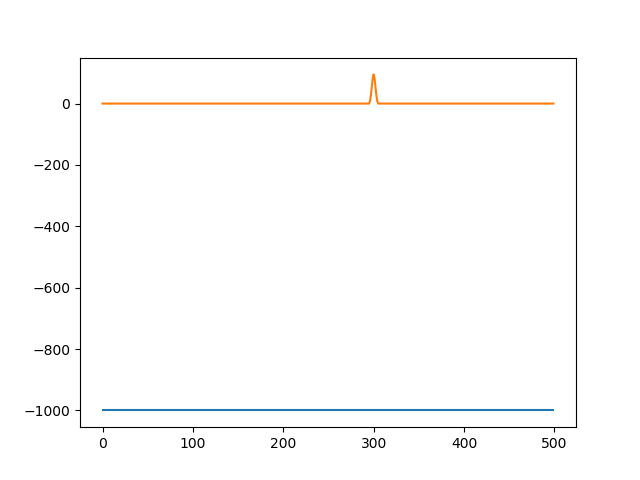

In [49]:
sizex, sizey = 500, 50
oned = {
    'h': np.float32(1000*np.ones((sizex,sizey))),
    'n': np.float32(1*lingauss((sizex, sizey), 2, 300)),
    'u': np.zeros((sizex+1, sizey), dtype=np.float32),
    'v': np.zeros((sizex, sizey+1), dtype=np.float32),
    'dx': np.float32(50),
    'dy': np.float32(50),
#     'dt': np.float32(0.3),
    'lat': np.zeros((sizex,)),
    'lon': np.zeros((sizey,))
}
plt.figure()
plt.plot(-oned['h'][:,5])
plt.plot(oned['n'][:,5]*100)
plt.show()
onedstate = State(**oned)

In [61]:
onedframes, onedMax = simulate(onedstate, 550, timestep=forward, saveinterval=2,\
                               dudt_x = dudt_drive_numba, dvdt_x = dvdt_drive_numba, dndt_x = dndt_drive_numba, \
                               bounds=[1, 1, 1, 1], \
                               grav=True, cori=True, advx=True, advy=True, attn=True)[:2]

simulating...
simulation complete


<IPython.core.display.Javascript object>


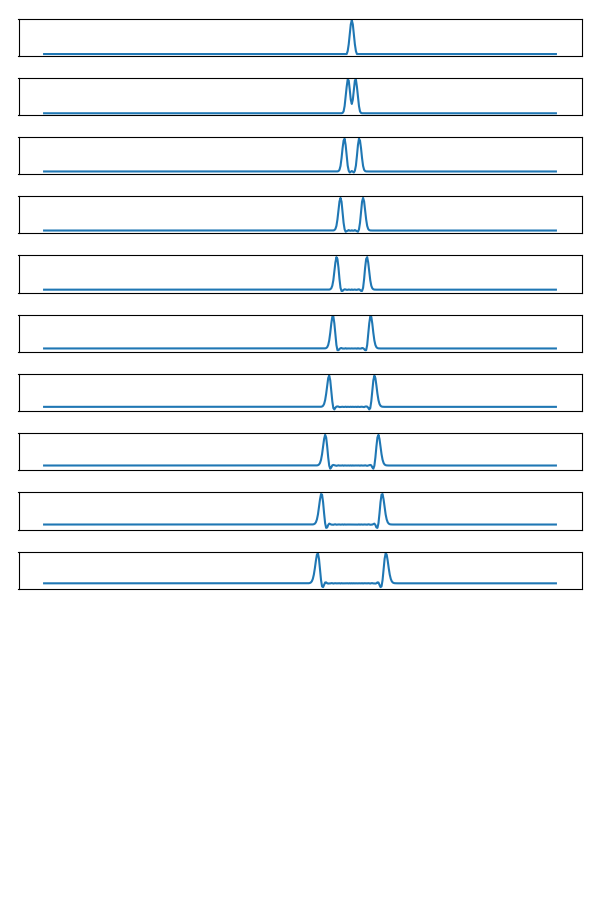

<IPython.core.display.Javascript object>


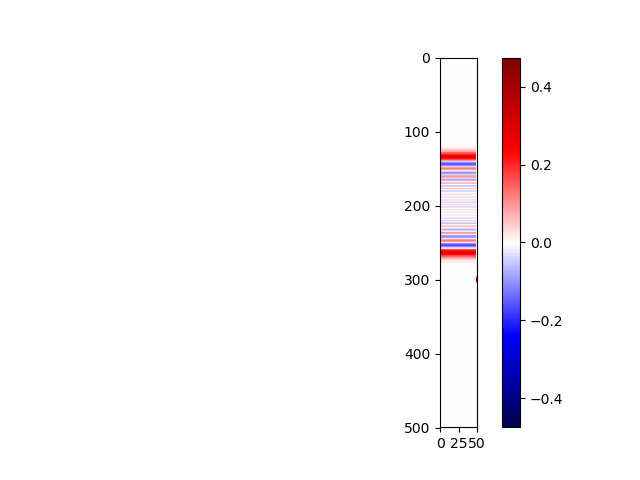

In [62]:
fig = plt.figure(22, figsize=(6, 9))
mmax = np.max(np.abs(onedframes))/2
plt.imshow(onedframes[:,:,25])
for i in range(10):
    f = i*1
    plt.subplot(15,1,i+1)
    plt.plot(onedframes[f,:,25])
    plt.xticks([],[])
    plt.yticks([],[])
plt.tight_layout()

plt.figure()

onedart = [(plt.imshow(frame, vmin=-mmax, vmax=mmax, cmap='seismic'),) for frame in onedframes]

anim = animation.ArtistAnimation(fig, onedart, interval=20, blit=True, repeat_delay=200)
plt.colorbar()
# coast = plt.contour(oned['h'], levels=1, colors=['black'])
# anim.save('../results/simpleplop.mp4')
plt.show()

# Palu event

### setting up instance for palu

In [63]:
palu = {}
latran = (-1.2, 0.2) # latitude range map covers
lonran = (118.7, 121) # longitude range map covers

# calculate height of map  11100*lat degrees = meters
# calculate width of map  1 lon degree = cos(lat) lat degrees, *11100 = meters
# use lon degree size of average latitude
realsize = (111000*(latran[1]-latran[0]),\
               111000*(lonran[1]-lonran[0])\
                  *np.cos((latran[1]-latran[0])/2))# h, w of map in meters
    
size = (700, 1150)# grid size of the map lat, lon


palu['dx'] = np.float32(realsize[1]/size[1])
palu['dy'] = np.float32(realsize[0]/size[0])
print('dx and dy ', palu['dx'], palu['dy'])

# read in bathymetry data
bathdata = nc.Dataset('../data/bathymetry.nc','r')
bathlat = bathdata.variables['lat']
bathlon = bathdata.variables['lon']
#calculate indexes of bathymetry dataset we need
bathlatix = np.linspace(np.argmin(np.abs(bathlat[:]-latran[0])),\
                        np.argmin(np.abs(bathlat[:]-latran[1])),\
                        size[0], dtype=int)
bathlonix = np.linspace(np.argmin(np.abs(bathlon[:]-lonran[0])),\
                        np.argmin(np.abs(bathlon[:]-lonran[1])),\
                        size[1], dtype=int)
# print(bathlatix, bathlonix)
palu['h'] = np.asarray(-bathdata.variables['elevation'][bathlatix, bathlonix], dtype=np.float32)
palu['lat'] = np.asarray(bathlat[bathlatix])
palu['lon'] = np.asarray(bathlon[bathlonix])

palu['n'] = np.zeros(size, dtype=np.float32)
palu['u'] = np.zeros((size[0]+1,size[1]), dtype=np.float32)
palu['v'] = np.zeros((size[0],size[1]+1), dtype=np.float32)
paluState = State(**palu)

dx and dy  169.79497 222.0


In [64]:

fig = plt.figure(166)
coast = plt.contour(palu['h'], levels=1, colors='black')
xtixks = plt.xticks(np.linspace(0, palu['h'].shape[1], 5),\
           np.round(np.linspace(palu['lon'][0], palu['lon'][-1], 5), 3))
yticks = plt.yticks(np.linspace(0, palu['h'].shape[0], 5),\
           np.round(np.linspace(palu['lat'][0], palu['lat'][-1], 5), 3))

### create array of the lat, lon position of the multiple testing events

In [65]:
# rad = 0.4 # radius in latitude degrees
# center = (-0.63,119.75) # point events are equidistant from
# dtheta = np.pi/8 # how far the events are from each other
# firsttheta = np.pi/2 # the first events angle from east
# eventcount = 6 # how many events to simulate

#(center[0] + rad*np.sin( firsttheta + evnum*dtheta ),\
                      # center[1] + rad*np.cos( firsttheta + evnum*dtheta ))\

dist = 33000 #17000 # m from mouth of palu bay
center = (-0.63, 119.65) # point events are equidistant from
startang = np.pi/4 # angle of first event
endang = np.pi+0.01 # angle of last event
dang = np.pi/16 # change in angle

argcenter = (np.argmin(np.abs(paluState.lat-center[0])), \
             np.argmin(np.abs(paluState.lon-center[1]))) # the index of the center point
argdist = int(dist/paluState.dx)

print(argdist, argcenter)


seiswidth = int(5000/paluState.dx)
seislength = int(10000/paluState.dy)

    

# initns = np.array([seismic(paluState.n.shape, \
#                               width = seiswidth, \
#                               length = seislength, \
#                               a1 = 4, a2 = 1, \
#                               cx = argcenter[0]-np.cos(ang)*argdist, \
#                               cy = argcenter[1]-np.sin(ang)*argdist, \
#                               theta = ang+np.pi) \
#                       for ang in np.arange(startang, endang, dang)]) # array of the lat, lon positions of each event

initns = 5*np.array([planegauss(paluState.n.shape, \
                              wx = seiswidth, \
                              wy = seiswidth, \
                              cx = argcenter[0]-np.cos(ang)*argdist, \
                              cy = argcenter[1]-np.sin(ang)*argdist, \
                              theta = ang+np.pi) \
                      for ang in np.arange(startang, endang, dang)]) # array of the lat, lon positions of each event

194 (286, 475)


### plot the initial events

<IPython.core.display.Javascript object>


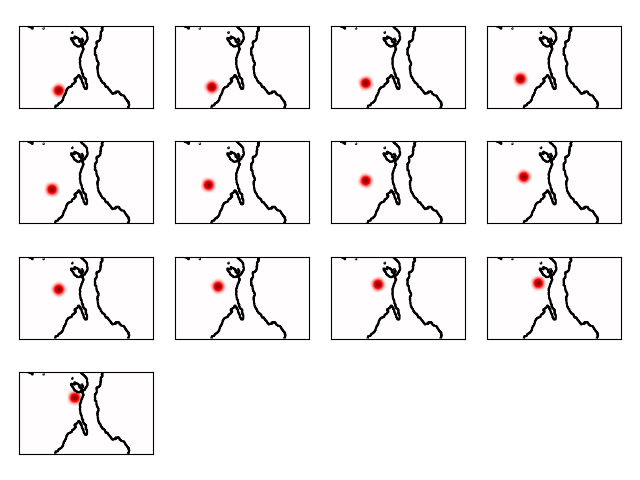

In [66]:

spnum = 1
spcount = initns.shape[0]
plt.figure(176)
mmax = np.max(np.abs(initns))
for initn in initns:
    plt.subplot(int(np.int(np.sqrt(spcount)))+1, spcount/int(np.int(np.sqrt(spcount))), spnum)
    
    # sea surface height
    plt.imshow(initn[::-1], cmap='seismic', vmax=mmax, vmin=-mmax)
    
    # coast
    coast = plt.contour(palu['h'][::-1], levels=1, colors='black')
#     xtixks = plt.xticks(np.linspace(0, palu['h'].shape[1], 5),\
#                np.round(np.linspace(palu['lon'][0], palu['lon'][-1], 5), 3))
#     yticks = plt.yticks(np.linspace(0, palu['h'].shape[0], 5),\
#                np.round(np.linspace(palu['lat'][0], palu['lat'][-1], 5), 3))
    plt.xticks([], [])
    plt.yticks([], [])
    
    spnum += 1
plt.tight_layout()

### run each event and collect output (max, min, ntt-[memmap]) in array

In [69]:
paluState = State(**palu)

eventcount = initns.shape[0]

maxes = np.zeros((eventcount,) + paluState.n.shape)#np.array([])
# mins = np.zeros((eventcount,) + paluState.shape)#np.array([])
# nttmm = np.array([])

evnum = 0 # keep track of which event number were on

for initn in initns:
    initd = dict(palu) # create copy of Palu init conditons
    initd['n'] = initn # with the initial SSH of this specific event
    initstate = State(**initd) # turn into instance of State class
    
    maxn = simulate(initstate, 2500, timestep=genfb, landthresh=5,\
                    dudt_x=dudt_drive_numba, dvdt_x=dvdt_drive_numba, dndt_x=dndt_drive_numba, \
                    grav=True, cori=True, advx=True, advy=True, attn=True)[1] # simulate it
    
    print('finished event ' + str(evnum)) # show progress
    
    maxes[evnum] = maxn # record data for this event
#     mins[evnum] = minn
#     maxes[evnum] = maxn
    
    evnum += 1
print('all done')
# save results
np.save('../results/palumaxheights', maxes)

simulating...
simulation complete
finished event 0
simulating...
simulation complete
finished event 1
simulating...
simulation complete
finished event 2
simulating...
simulation complete
finished event 3
simulating...
simulation complete
finished event 4
simulating...
simulation complete
finished event 5
simulating...
simulation complete
finished event 6
simulating...
simulation complete
finished event 7
simulating...
simulation complete
finished event 8
simulating...
simulation complete
finished event 9
simulating...
simulation complete
finished event 10
simulating...
simulation complete
finished event 11
simulating...
simulation complete
finished event 12
all done


In [ ]:
# or load previous results
maxes = np.load('../results/palumaxheights.npy')

In [72]:
ntt = simulate(initstate, 2500, timestep=genfb, landthresh=5, saveinterval=100,\
                    dudt_x=dudt_drive_numba, dvdt_x=dvdt_drive_numba, dndt_x=dndt_drive_numba, \
                    grav=True, cori=True, advx=True, advy=True, attn=True)[0] # simulate it


simulating...
simulation complete


<IPython.core.display.Javascript object>


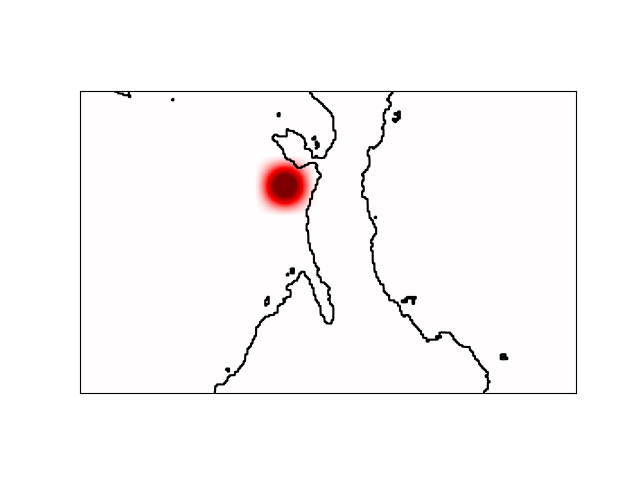

In [82]:
plt.figure()
coast = plt.contour(palu['h'][::-1]-1.5, levels=1, colors='black') # plot coast
plt.imshow(initn[::-1], cmap='seismic', vmin=-3, vmax=3)
plt.xticks([],[])
plt.yticks([],[])
plt.savefig('../results/palu-anim-start')
plt.show()

<IPython.core.display.Javascript object>


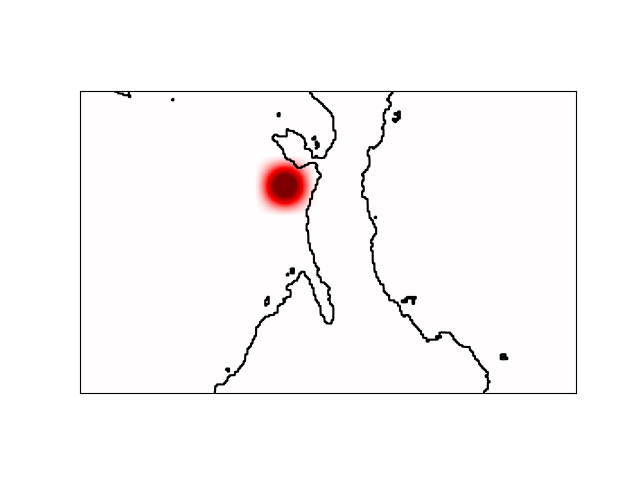

<IPython.core.display.Javascript object>


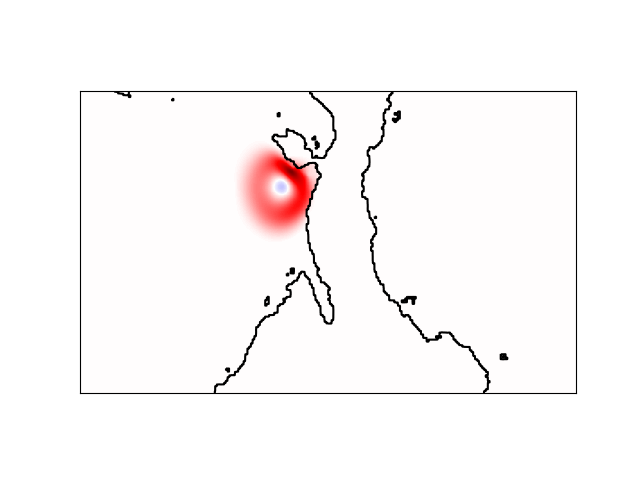

<IPython.core.display.Javascript object>


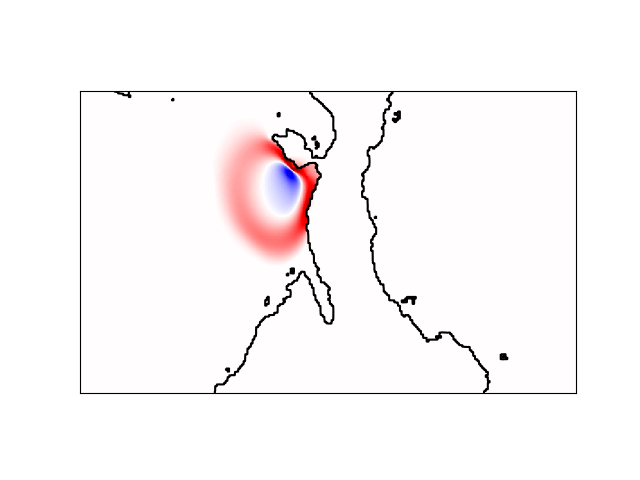

<IPython.core.display.Javascript object>


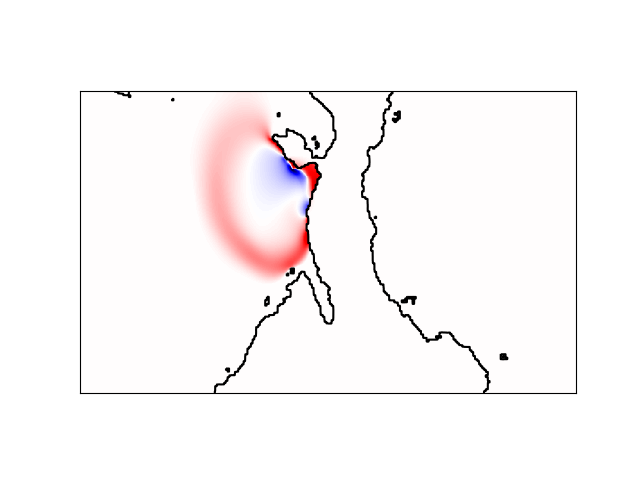

<IPython.core.display.Javascript object>


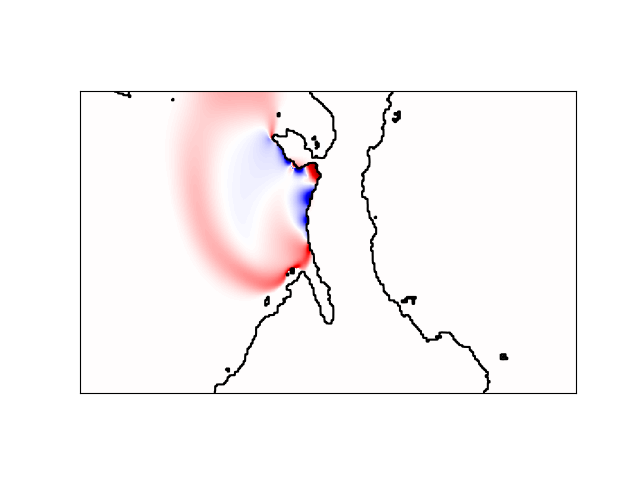

<IPython.core.display.Javascript object>


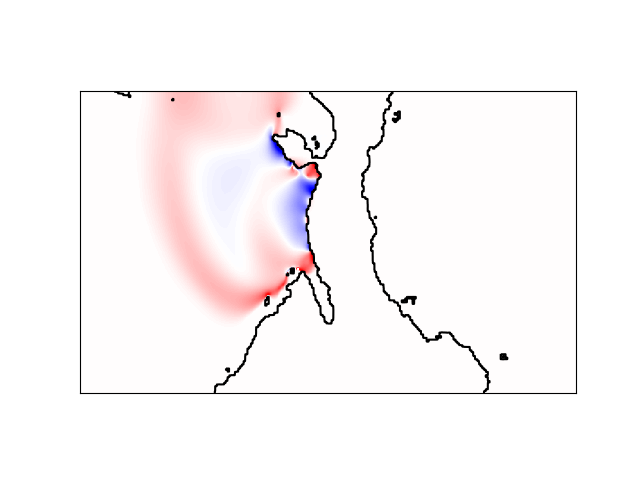

<IPython.core.display.Javascript object>


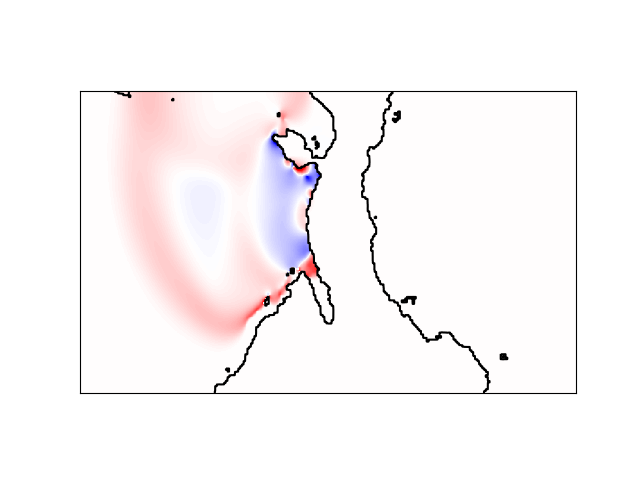

<IPython.core.display.Javascript object>


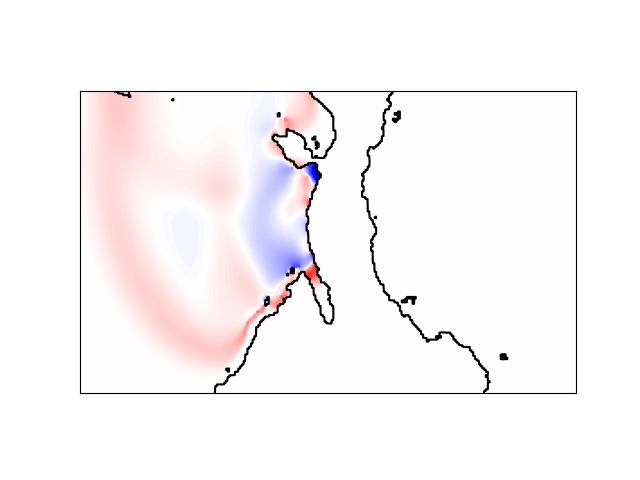

<IPython.core.display.Javascript object>


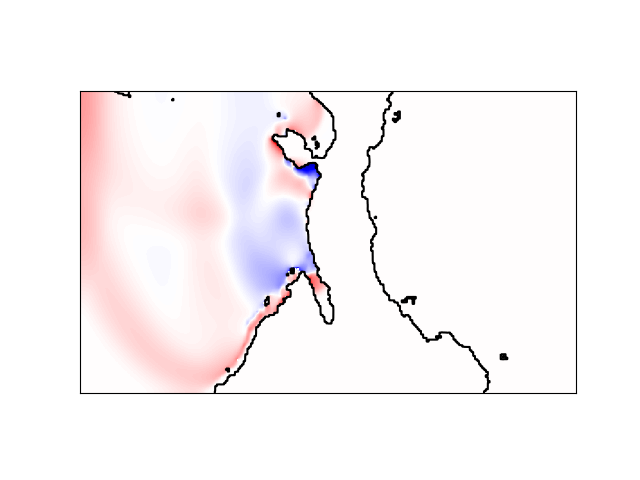

<IPython.core.display.Javascript object>


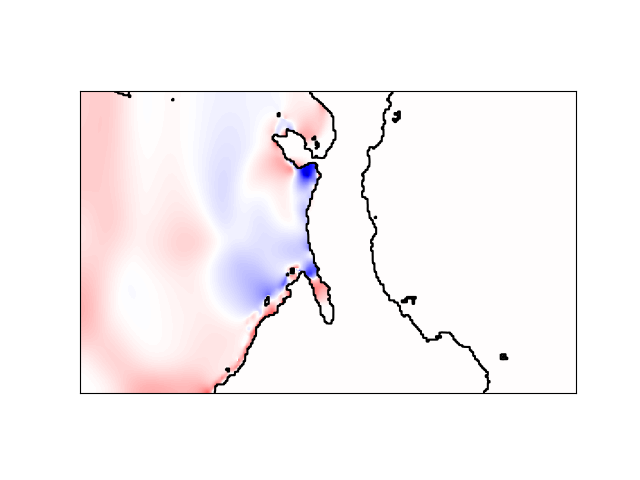

<IPython.core.display.Javascript object>


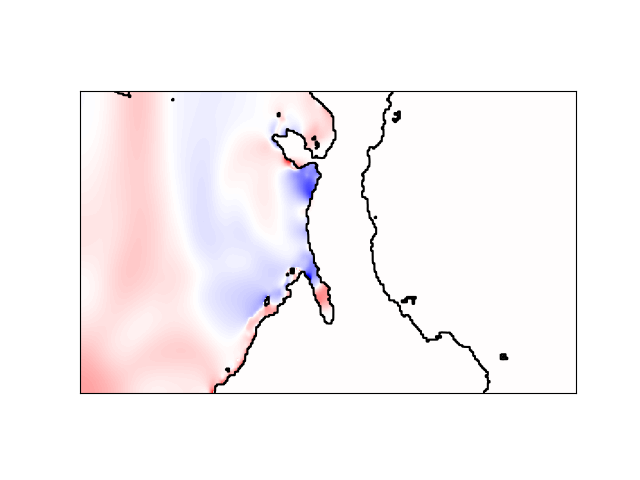

<IPython.core.display.Javascript object>


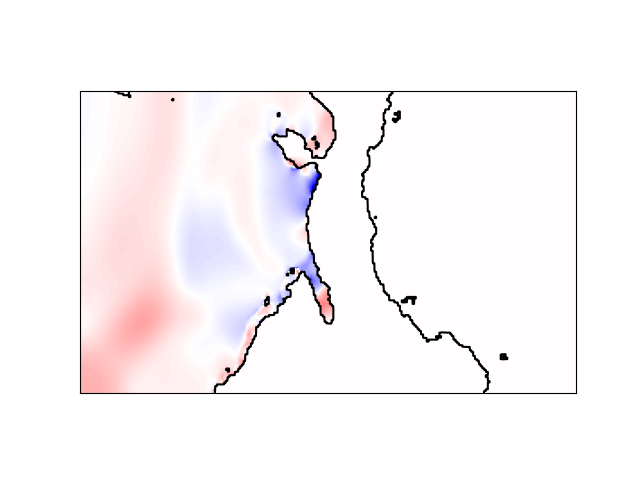

<IPython.core.display.Javascript object>


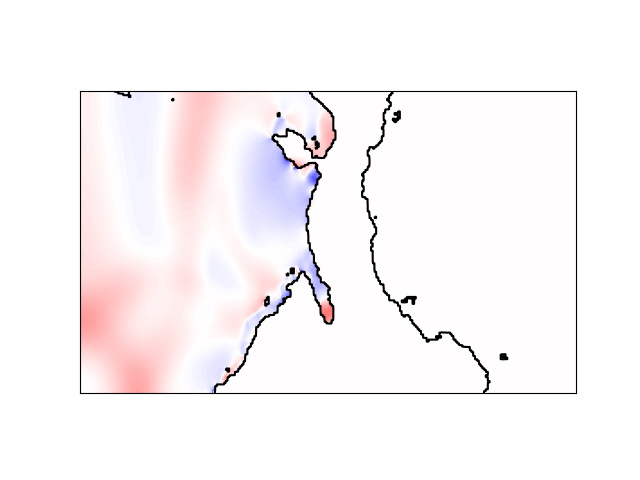

<IPython.core.display.Javascript object>


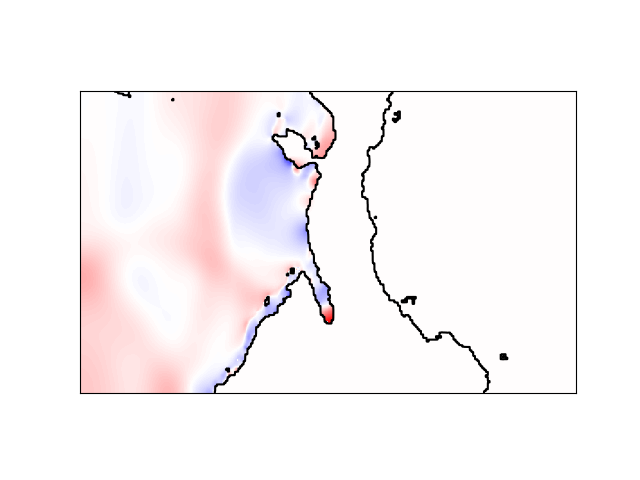

<IPython.core.display.Javascript object>


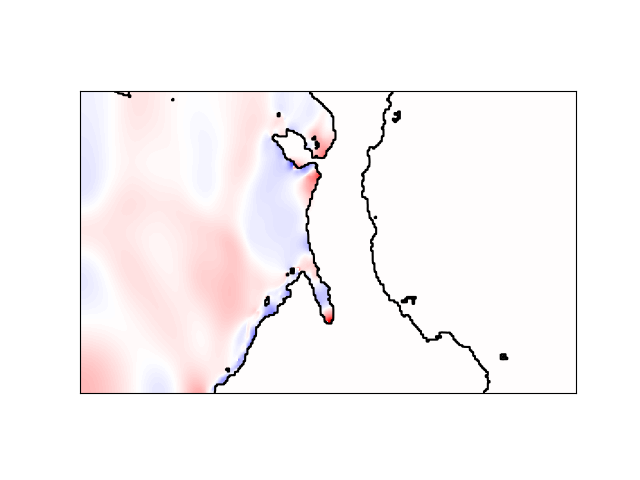

<IPython.core.display.Javascript object>


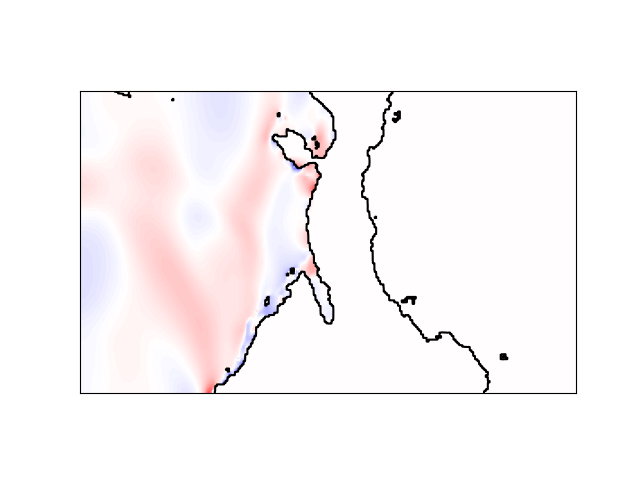

<IPython.core.display.Javascript object>


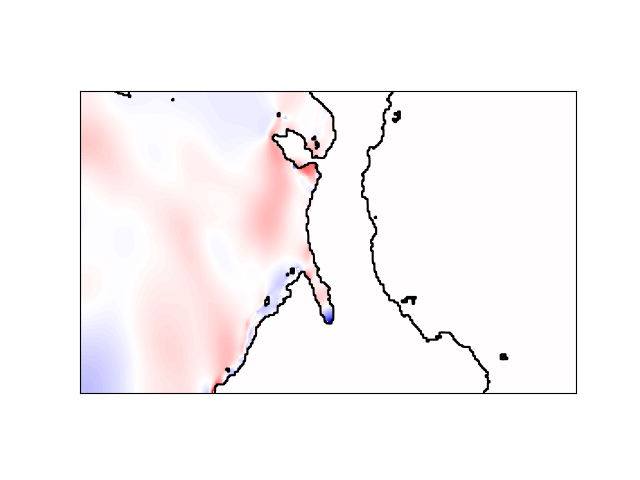

<IPython.core.display.Javascript object>


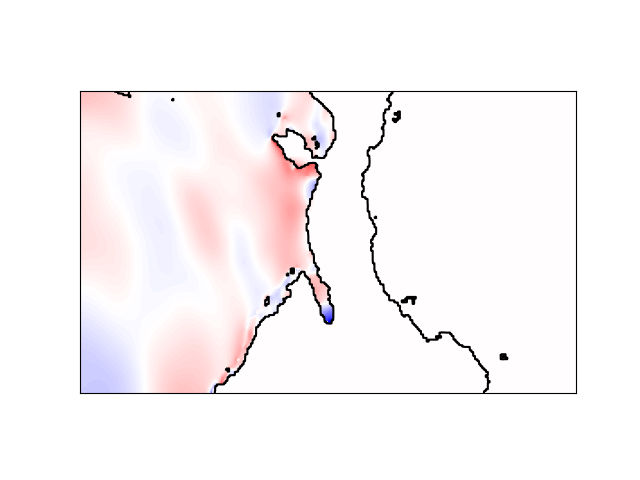

<IPython.core.display.Javascript object>


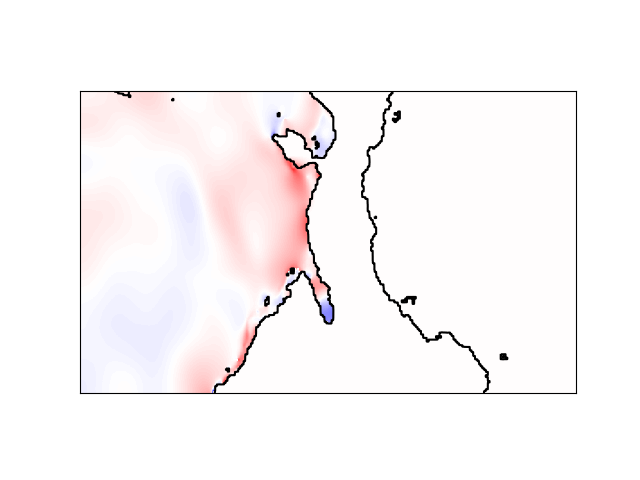

<IPython.core.display.Javascript object>


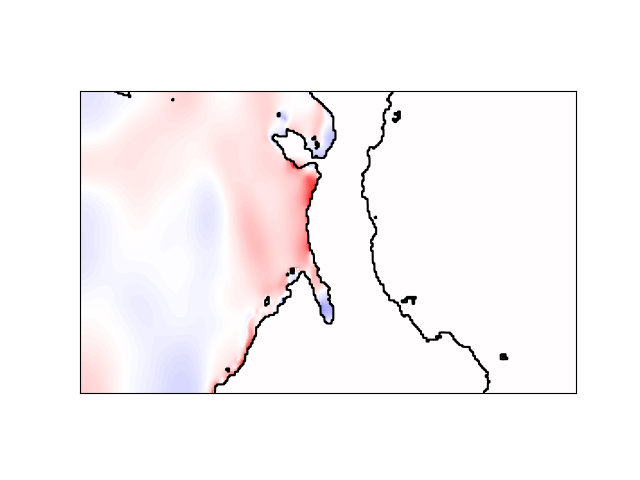

<IPython.core.display.Javascript object>


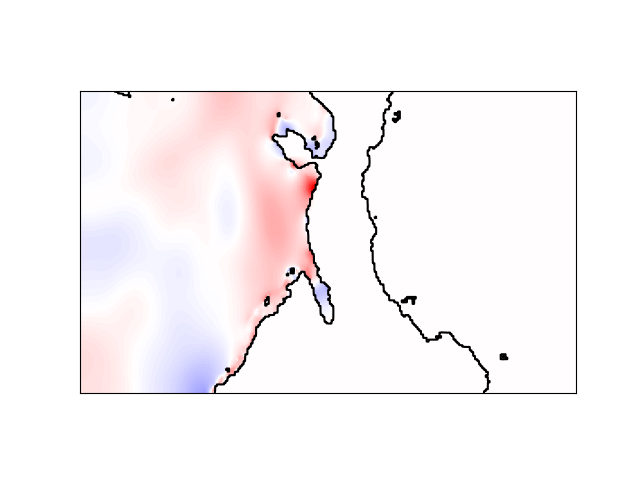

<IPython.core.display.Javascript object>


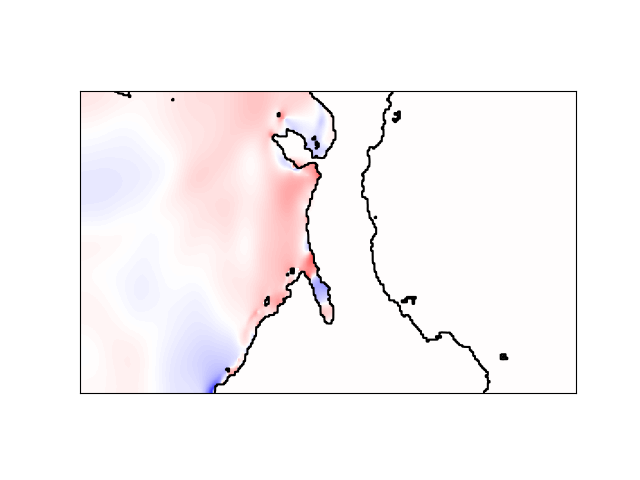

<IPython.core.display.Javascript object>


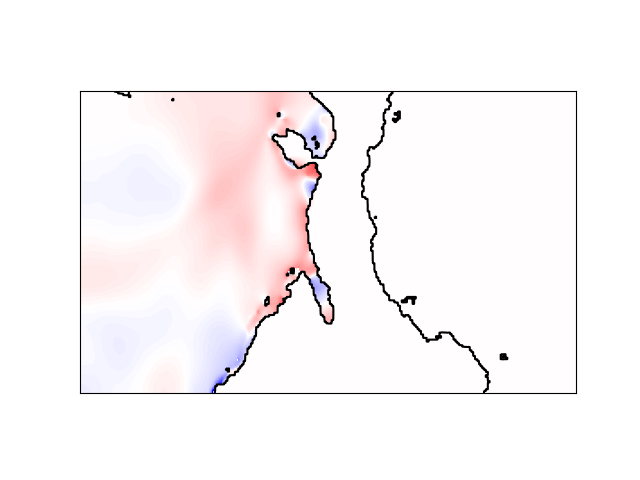

<IPython.core.display.Javascript object>


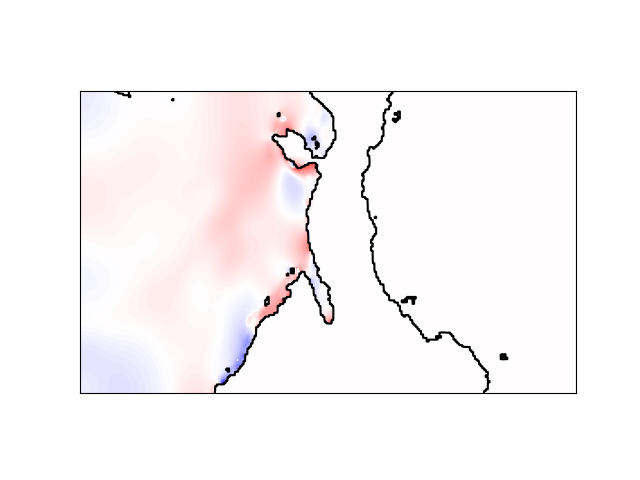

<IPython.core.display.Javascript object>


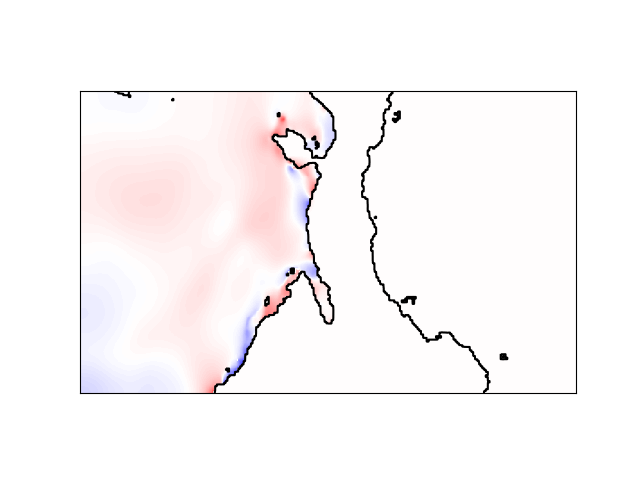

<IPython.core.display.Javascript object>


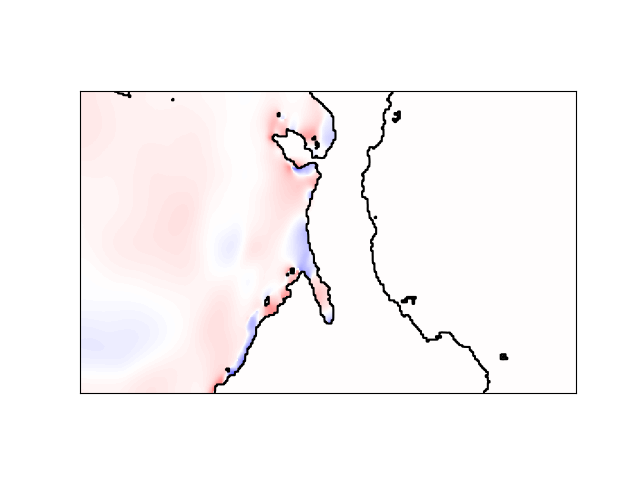

In [83]:
for num, frame in enumerate(ntt):
    plt.figure()
    coast = plt.contour(palu['h'][::-1]-1.5, levels=1, colors='black') # plot coast
    plt.imshow(frame[::-1], cmap='seismic', vmin=-3, vmax=3)
    plt.xticks([],[])
    plt.yticks([],[])
    plt.savefig('../results/palu-anim-' + str(num))
    plt.show()

### display outcomes of each event

In [ ]:
print('maxes: ',maxes.shape)
print('n: ', paluState.n.shape)

<IPython.core.display.Javascript object>


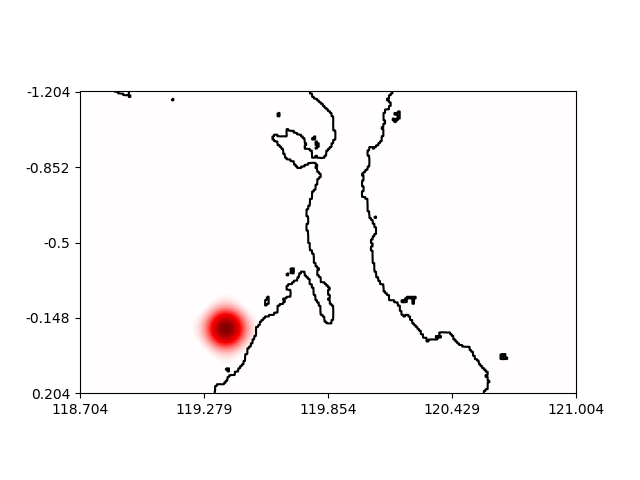

<IPython.core.display.Javascript object>


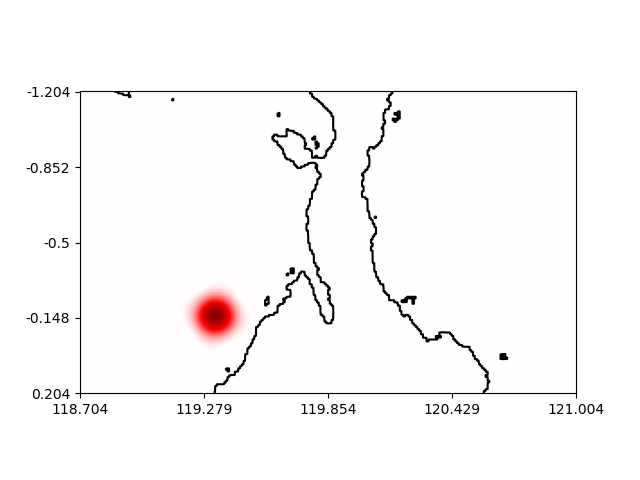

/home/rrs/anaconda3/envs/shallowwater/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


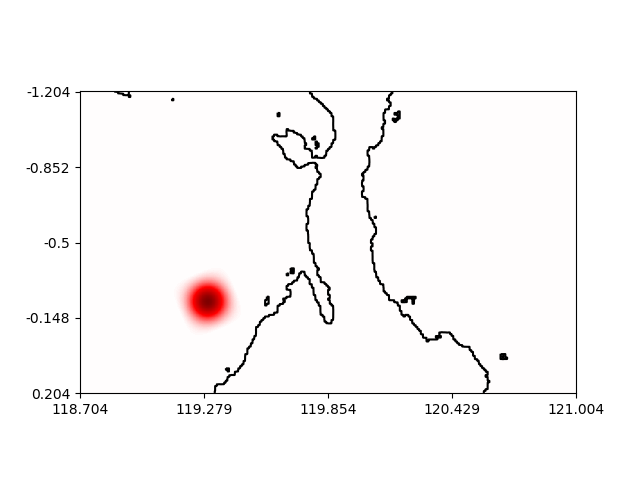

<IPython.core.display.Javascript object>


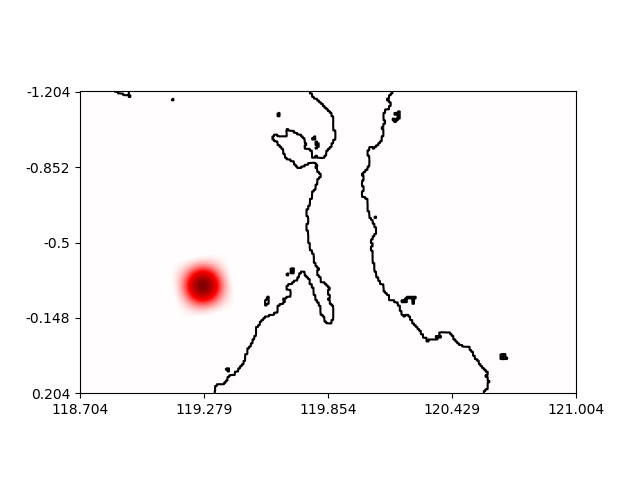

<IPython.core.display.Javascript object>


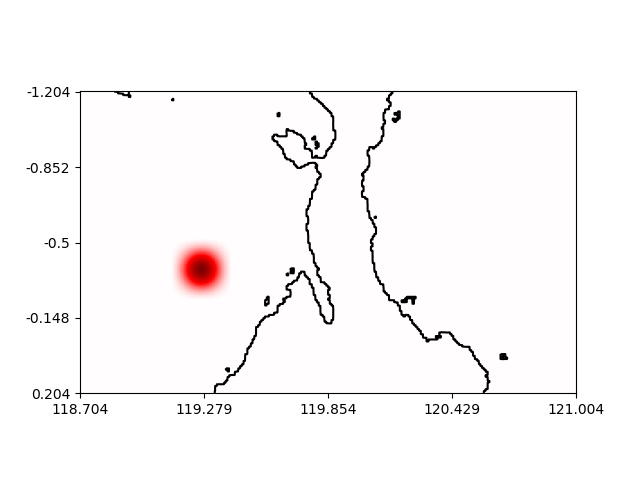

<IPython.core.display.Javascript object>


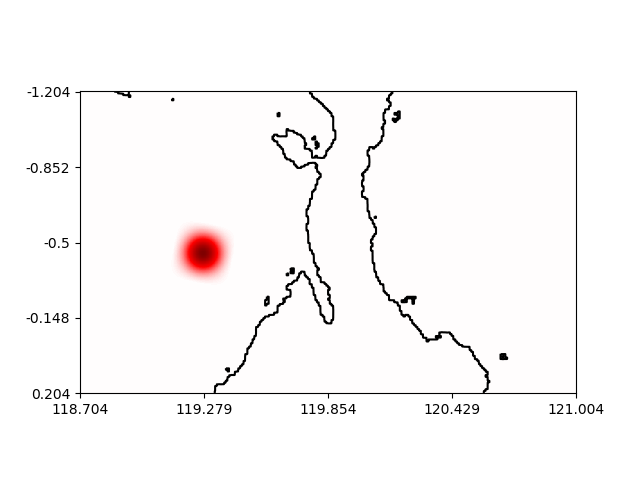

<IPython.core.display.Javascript object>


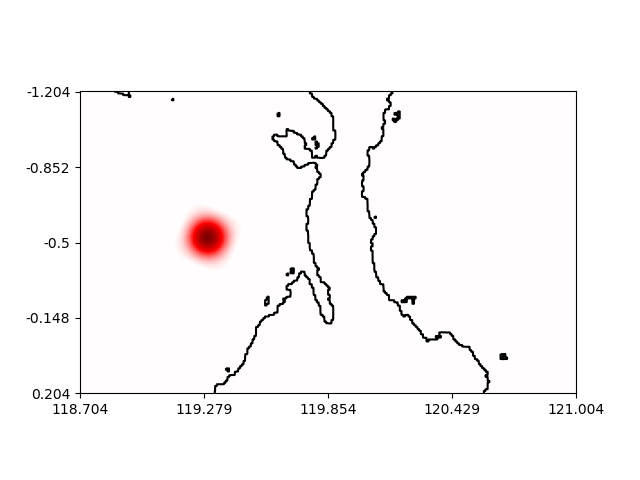

<IPython.core.display.Javascript object>


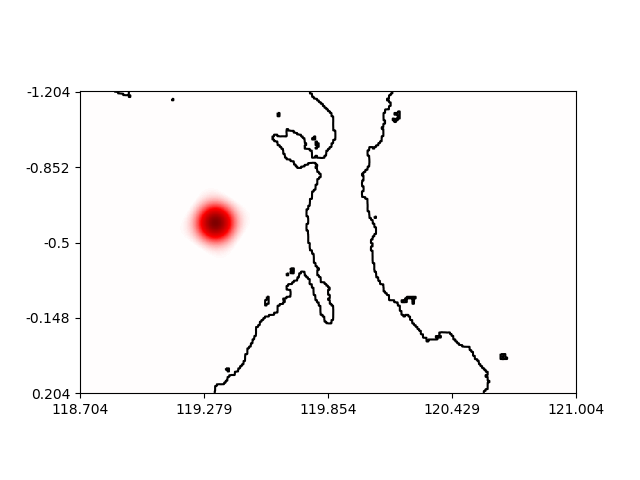

<IPython.core.display.Javascript object>


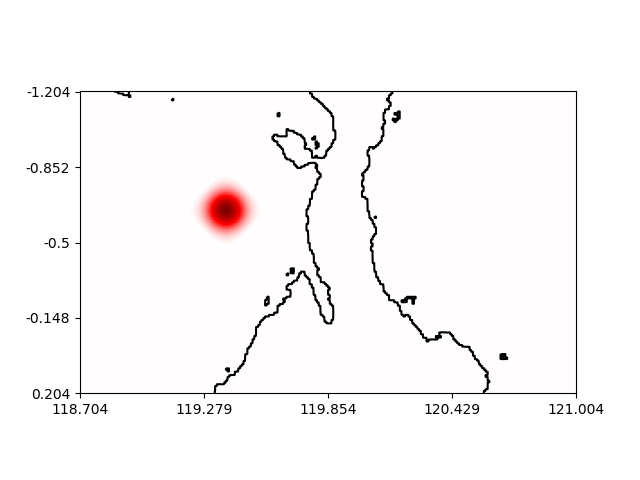

<IPython.core.display.Javascript object>


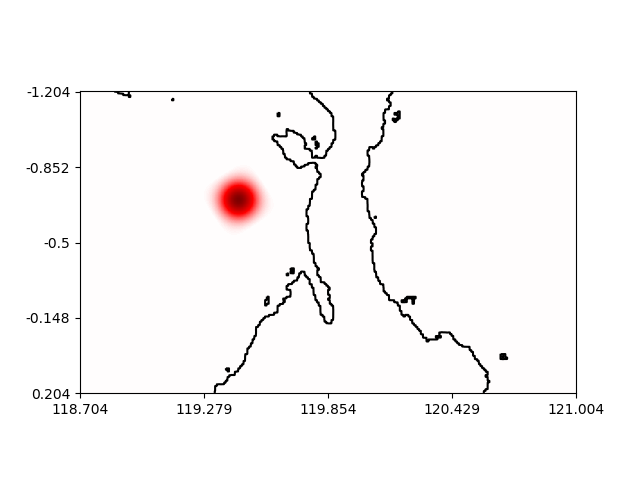

<IPython.core.display.Javascript object>


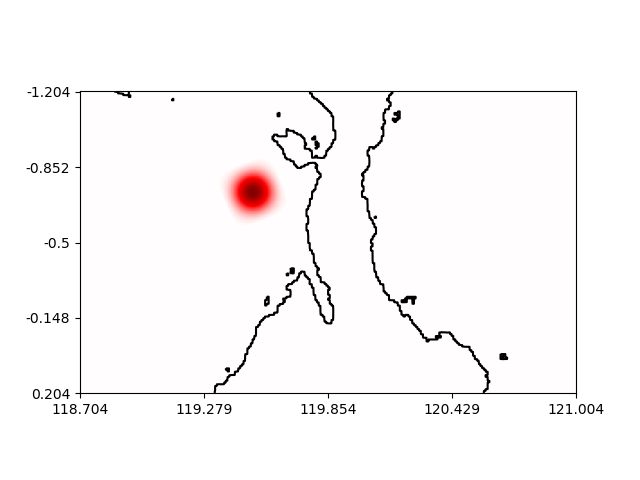

<IPython.core.display.Javascript object>


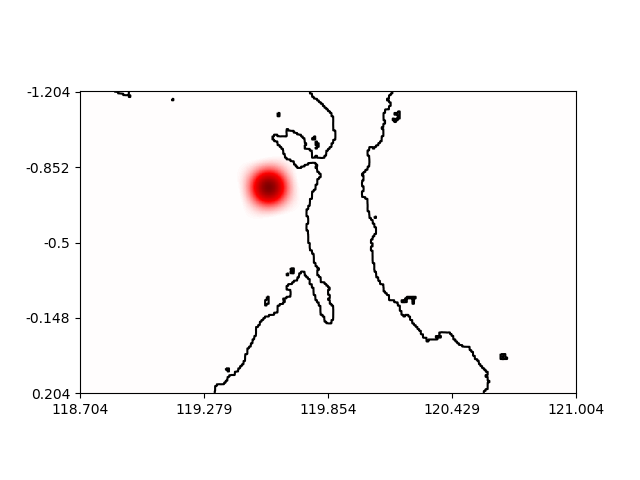

<IPython.core.display.Javascript object>


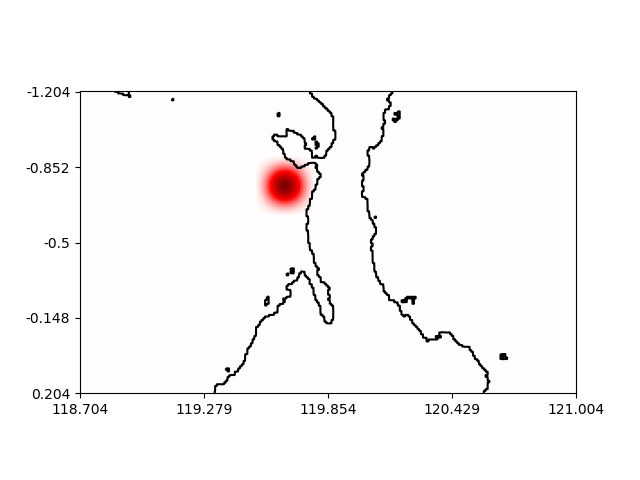

<IPython.core.display.Javascript object>


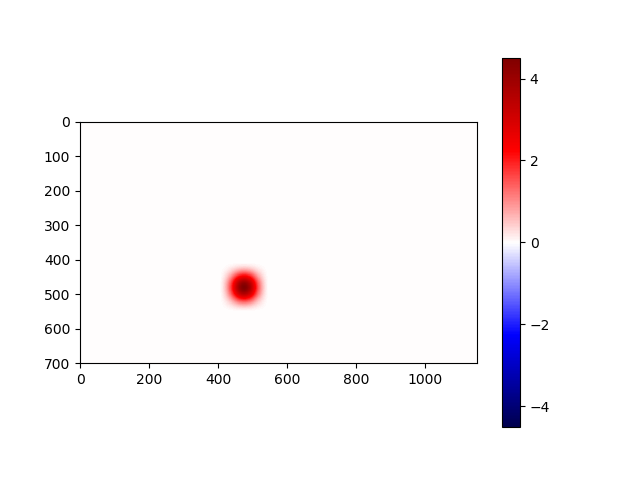

<IPython.core.display.Javascript object>


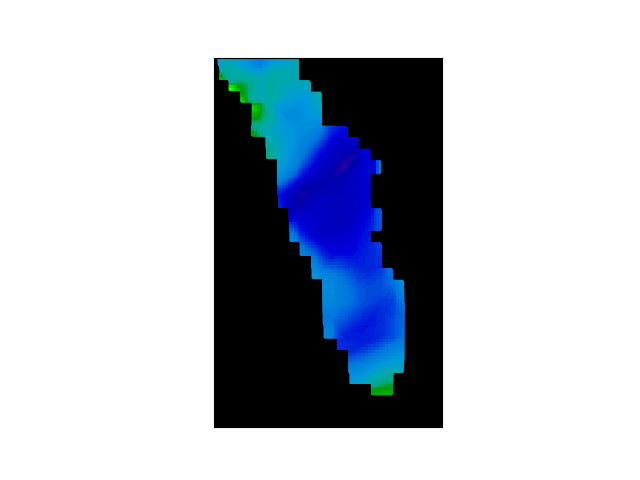

<IPython.core.display.Javascript object>


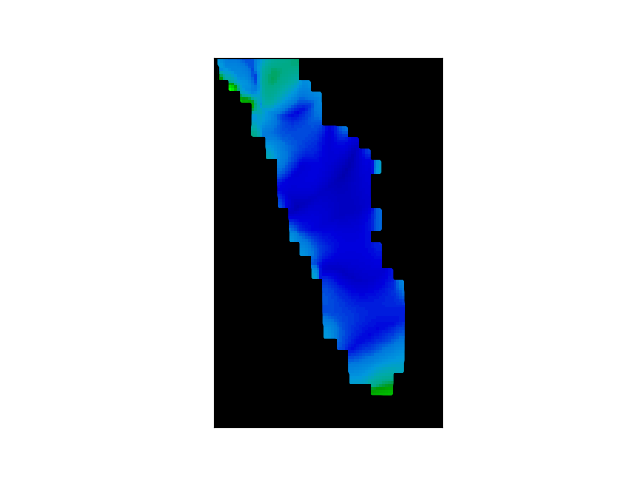

<IPython.core.display.Javascript object>


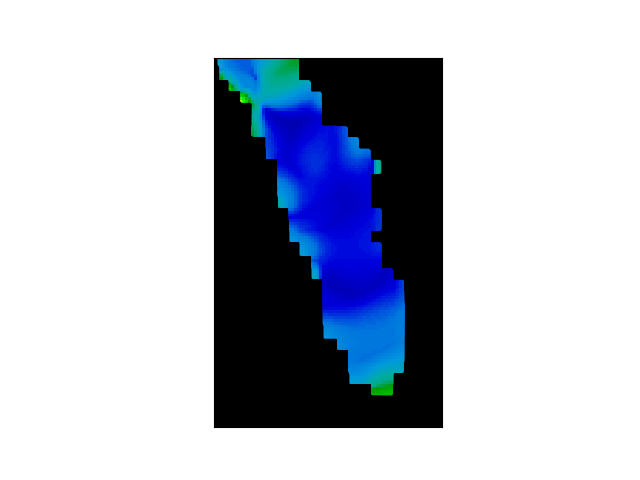

<IPython.core.display.Javascript object>


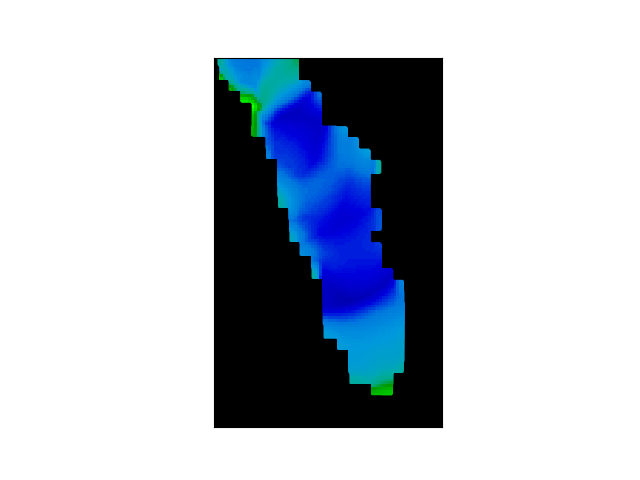

<IPython.core.display.Javascript object>


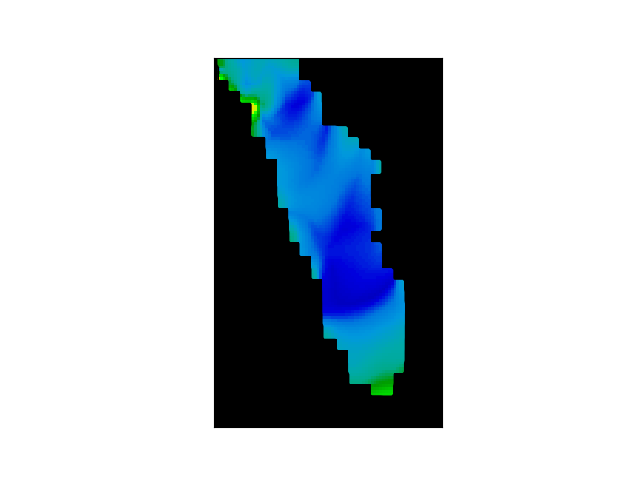

<IPython.core.display.Javascript object>


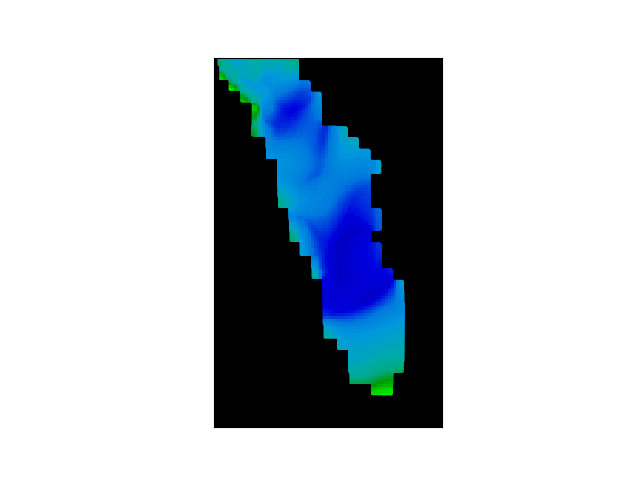

<IPython.core.display.Javascript object>


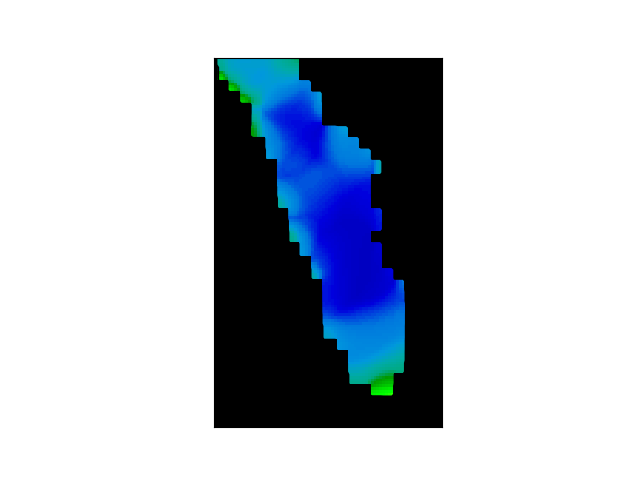

<IPython.core.display.Javascript object>


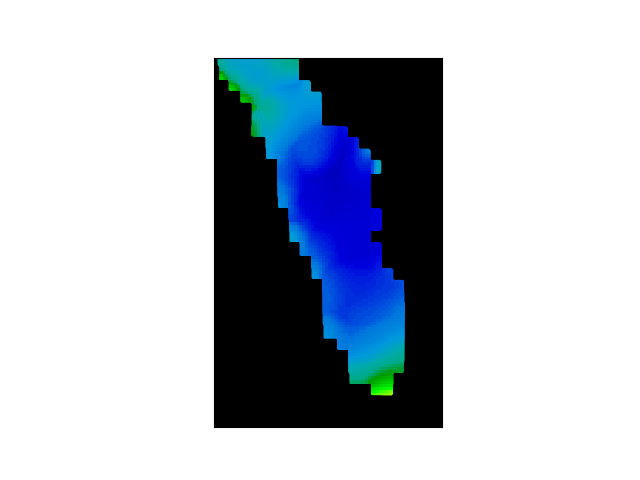

<IPython.core.display.Javascript object>


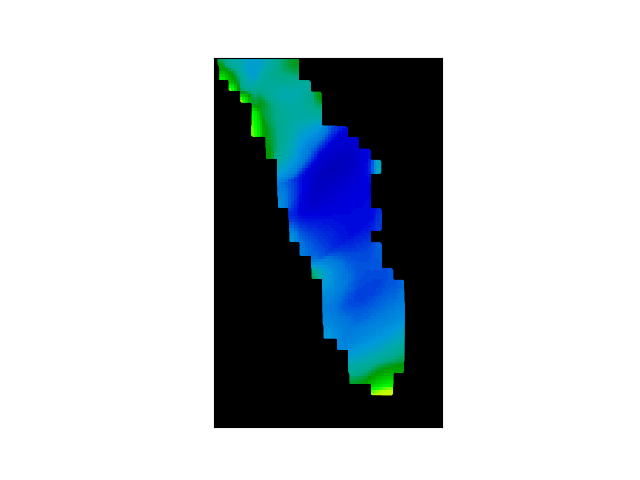

<IPython.core.display.Javascript object>


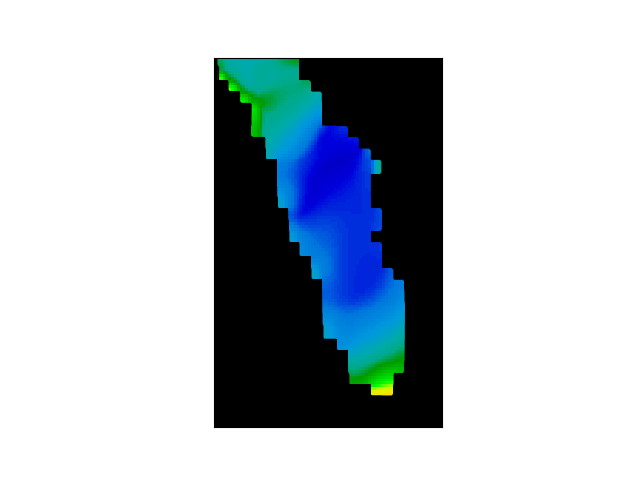

<IPython.core.display.Javascript object>


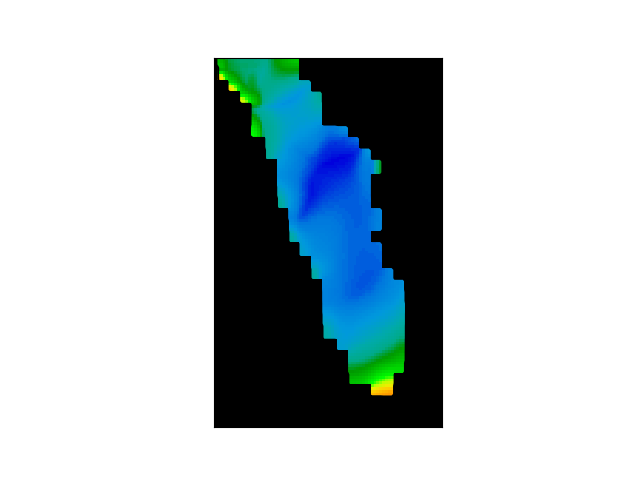

<IPython.core.display.Javascript object>


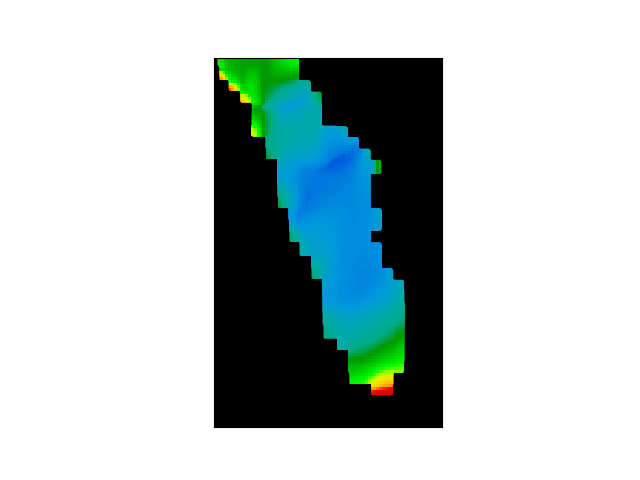

<IPython.core.display.Javascript object>


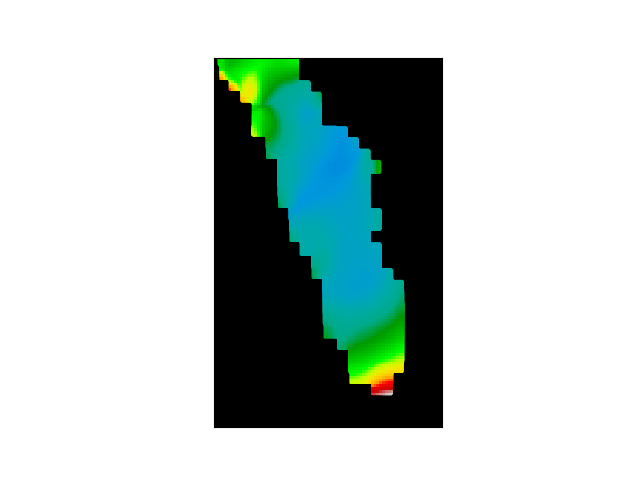

<IPython.core.display.Javascript object>


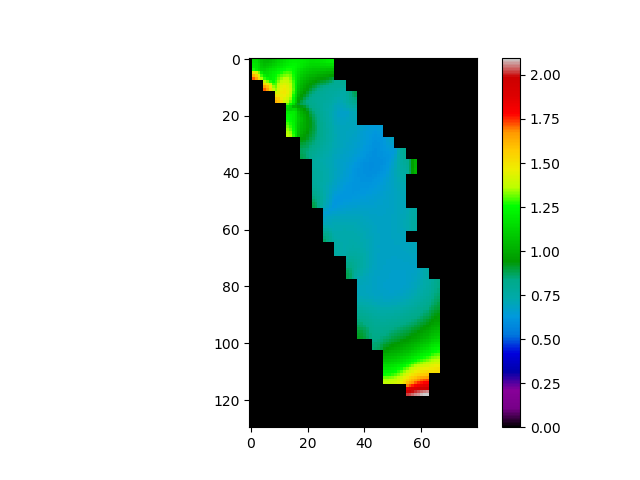

In [70]:

stfignum = 117 # the neighborhood of figure numbers in use

# fignum = 0 # specific figure

#window including just palu bay
pb1 = 150
pb2 = 280
pb3 = 520
pb4 = 600

mmax = np.max(maxes[:,pb1:pb2,pb3:pb4]) # true max of maxes
imax = np.max(initns) # true max of initial SSH's

for fignum, initn in enumerate(initns): # display initial SSH of each event
    fig = plt.figure(stfignum+fignum) # start new figures
    
#     plt.subplot(1, 2, 1)
    plt.imshow(initn[::-1], cmap='seismic', vmax = imax, vmin=-imax)# plot initial condition
    coast = plt.contour(palu['h'][::-1]-1.5, levels=1, colors='black') # plot coast
    
    # use latitude, longitude tick markers
    xtixks = plt.xticks(np.linspace(0, palu['h'][::-1].shape[1], 5),\
               np.round(np.linspace(palu['lon'][0], palu['lon'][-1], 5), 3))
    yticks = plt.yticks(np.linspace(0, palu['h'][::-1].shape[0], 5),\
               np.round(np.linspace(palu['lat'][0], palu['lat'][-1], 5), 3))
    # use no tickmarks
#     plt.xticks([], [])
#     plt.yticks([], [])
    
    plt.savefig('../results/palu-init-' + str(fignum)) # download image
    
#     fignum+=1 # next figure
 # repeat of last with colorbar
plt.figure(stfignum+13)
plt.imshow(initns[-1], cmap='seismic', vmax=imax, vmin=-imax)
plt.colorbar()
plt.savefig('../results/palu-init-cb')
# fignum+=1
for fignum, maxn in enumerate(maxes): # display maximum heights in palu bay of each event
    fig = plt.figure(stfignum+fignum+14) # start new figure
    
#     plt.subplot(1, 2, 2)
    plt.imshow(maxn[pb2:pb1:-1, pb3:pb4], cmap='nipy_spectral', vmax=mmax, vmin=0) # show max height image
    coast = plt.contour(palu['h'][pb2:pb1:-1, pb3:pb4]-1.5, levels=1, colors='black') # the coast
    
    # use latitude, longitude tickmarks
#     xtixks = plt.xticks(np.linspace(0, palu['h'].shape[1], 5),\
#                np.round(np.linspace(palu['lon'][0], palu['lon'][-1], 5), 3))
#     yticks = plt.yticks(np.linspace(0, palu['h'].shape[0], 5),\
#                np.round(np.linspace(palu['lat'][0], palu['lat'][-1], 5), 3))
    # use no tickmarks
    plt.xticks([], [])
    plt.yticks([], [])
    
    plt.savefig('../results/palu-max-' + str(fignum)) # download image
    
#     fignum += 1 # next figure
# repeat of last event, but with colorbar
plt.figure(stfignum+27)
plt.imshow(maxes[-1][pb2:pb1:-1, pb3:pb4], cmap='nipy_spectral', vmax=mmax, vmin=0)
plt.colorbar()
plt.savefig('../results/palu-max-cb')

In [24]:
from scipy import interpolate

In [25]:
krak = {}
latran = (-7.1, -5.4) # latitude range map covers
lonran = (104, 106.4) # longitude range map covers

# -6.104776, 105.417561
# calculate height of map  11100*lat degrees = meters
# calculate width of map  1 lon degree = cos(lat) lat degrees, *11100 = meters
# use lon degree size of average latitude
realsize = (111000*(latran[1]-latran[0]),\
               111000*(lonran[1]-lonran[0])\
                  *np.cos((latran[1]-latran[0])/2))# h, w of map in meters
    
size = (2880, 3680)# grid size of the map lat, lon

latix = np.linspace(latran[0], latran[1], size[0])
lonix = np.linspace(lonran[0], lonran[1], size[1])

krak['dx'] = np.float32(realsize[1]/size[1])
krak['dy'] = np.float32(realsize[0]/size[0])
print('dx and dy ', krak['dx'], krak['dy'])

# read in bathymetry data
bathdata = nc.Dataset('../data/bathymetry.nc','r')
bathlat = np.asarray(bathdata.variables['lat'])
bathlon = np.asarray(bathdata.variables['lon'])
#calculate indexes of bathymetry dataset we need
bathlatr = (np.argmin(np.abs(bathlat[:]-latran[0])),\
             np.argmin(np.abs(bathlat[:]-latran[1])))
bathlonr = (np.argmin(np.abs(bathlon[:]-lonran[0])),\
             np.argmin(np.abs(bathlon[:]-lonran[1])))
bath = np.asarray(-bathdata.variables['elevation'][bathlatr[0]:bathlatr[1], bathlonr[0]:bathlonr[1]], dtype=np.float32)

x = np.arange(0, bath.shape[0])
y = np.arange(0, bath.shape[1])

xnew = np.linspace(0, bath.shape[0]-1, size[0])
ynew = np.linspace(0, bath.shape[1]-1, size[1])

bath = interpolate.RectBivariateSpline(x,y,bath)
#
krak['h'] = np.asarray(bath(xnew,ynew), dtype=np.float32)#np.asarray(-bathdata.variables['elevation'][bathlatix, bathlonix], dtype=np.float32)
krak['lat'] = np.asarray(bathlat[np.linspace(bathlatr[0], bathlatr[1], size[0], dtype=int)])
krak['lon'] = np.asarray(bathlon[np.linspace(bathlonr[0], bathlonr[1], size[1], dtype=int)])

krak['n'] = 50*planegauss(size, 3, 3, \
                         cx=np.argmin(np.abs(latix+6.095)), \
                         cy=np.argmin(np.abs(lonix-105.414)))
krak['u'] = np.zeros((size[0]+1,size[1]), dtype=np.float32)
krak['v'] = np.zeros((size[0],size[1]+1), dtype=np.float32)
krakState = State(**krak)
print(krakState.dt)

dx and dy  47.777042 65.520836
0.05481994958887877


<IPython.core.display.Javascript object>


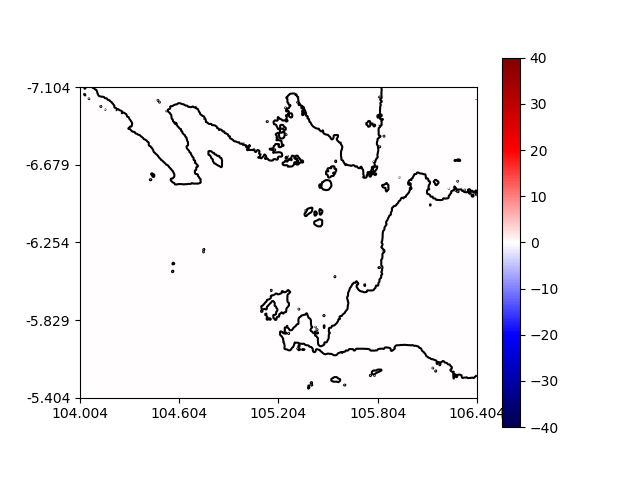

In [26]:
fig = plt.figure(165)
plt.clf()
ax = plt.subplot(1,1,1)
# bath = plt.imshow(krak['h'][::-1])#, levels=1, colors='black')
coast = plt.contour(krak['h'][::-1], levels=0, colors=['black'])#, 'white'])
coast = plt.imshow(krak['n'][::-1], cmap='seismic', vmax=40, vmin=-40)#, levels=10)#, colors=['black', 'white'])
cb = plt.colorbar()
# plt.imshow(krak['n'][::-1], cmap='seismic', vmin=-2, vmax=2)
xtixks = plt.xticks(np.linspace(0, krak['h'].shape[1], 5),\
           np.round(np.linspace(krak['lon'][0], krak['lon'][-1], 5), 3))
yticks = plt.yticks(np.linspace(0, krak['h'].shape[0], 5),\
           np.round(np.linspace(krak['lat'][0], krak['lat'][-1], 5), 3))
ax.set_aspect('equal')

In [27]:
from scipy import interpolate

x = np.arange(0, bath.shape[0])
y = np.arange(0, bath.shape[1])

xnew = np.linspace(0, bath.shape[0]-1, size[0])#*1.0*x.shape[0]/size[0]
ynew = np.linspace(0, bath.shape[1]-1, size[1])#*

# tck = interpolate.bisplrep(x, y, bath, s=0)
znew = interpolate.RectBivariateSpline(x,y,bath)#bisplev(xnew[:,0], ynew[0,:], tck)
# znew = interpolate.bisplev(ynew, xnew, tck)
bath2=np.asarray(znew(xnew,ynew))

bath2.shape

AttributeError: 'RectBivariateSpline' object has no attribute 'shape'

<IPython.core.display.Javascript object>


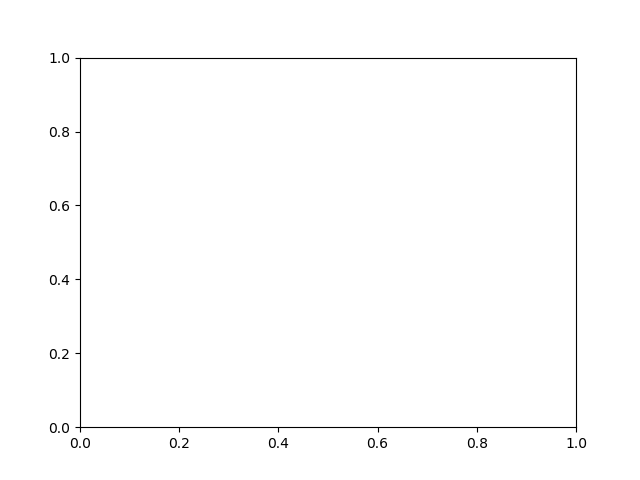

NameError: name 'bath2' is not defined

In [28]:
fig = plt.figure(168)
ax = plt.subplot(1,1,1)
# bath = plt.imshow(krak['h'][::-1])#, levels=1, colors='black')
coast = plt.contour(bath2, levels=0, colors=['black'])#, 'white'])
coast = plt.imshow(bath2)#, levels=10)#, colors=['black', 'white'])
cb = plt.colorbar()
# plt.imshow(krak['n'][::-1], cmap='seismic', vmin=-2, vmax=2)
# xtixks = plt.xticks(np.linspace(0, krak['h'].shape[1], 5),\
#            np.round(np.linspace(krak['lon'][0], krak['lon'][-1], 5), 3))
# yticks = plt.yticks(np.linspace(0, krak['h'].shape[0], 5),\
#            np.round(np.linspace(krak['lat'][0], krak['lat'][-1], 5), 3))
# ax.set_aspect('equal')

In [ ]:
x,y=np.meshgrid(np.arange(5),np.arange(6))
z = x*x+y*y

xf = np.arange(z.shape[0])/(z.shape[0]-1.0)
yf = np.arange(z.shape[1])/(z.shape[0]-1.0)
z.shape
inpt = interpolate.RectBivariateSpline(xf,yf, z)

plt.figure(1010)
plt.subplot(1,2,1)
plt.imshow(z)
xn = np.arange(10*z.shape[0])
xn = xn/(xn.shape[0]-1.0)
yn = np.arange(10*z.shape[1])
yn = yn/(yn.shape[0]-1.0)
plt.subplot(1,2,2)
plt.imshow(inpt(xn,yn))
del inpt

In [ ]:
krakNtt, krakMax = simulate(krakState, 3000, timestep=genfb, savecount=100, \
                    dudt_x=dudt, dvdt_x=dvdt, dndt_x=dndt, \
                    grav=True, cori=True, advx=True, advy=True, attn=True)[:2] #_drive_numba
np.save('../results/krakmax', krakMax)

In [42]:
krakNtt, krakMax = simulate(krakState, 3000, timestep=genfb, saveinterval=300, landthresh=15,\
                    dudt_x=dudt_drive_numba, dvdt_x=dvdt_drive_numba, dndt_x=dndt_drive_numba, \
                    grav=True, cori=True, advx=True, advy=True, attn=True)[:2] #
np.save('../results/krakframes', krakNtt)
np.save('../results/krakmax', krakMax)

simulating...
simulation complete


In [29]:
krakMax = np.load('../results/krakmax.npy')
krakNtt = np.load('../results/krakframes.npy')

In [48]:
krakMaxCoast = np.copy(krakMax)
# krakMaxCoast[np.greater(krak['h'], 30)] = zero
# krakMaxCoast = krakMaxCoast**5
atx, aty = np.where(np.logical_and(np.less(krak['h'], 20), np.greater(krak['h'], 5)))#.astype(float))
winx, winy = np.mgrid[-25:25,-25:25]
# nearx = atx+winx
# neary = aty+winy
winx = winx.flatten()
winy = winy.flatten()

winx = [[k] for k in winx]
nearx = winx + atx
neary = winy[:,np.newaxis] + aty

# nearx = np.abs(nearx)
nearx[np.greater(nearx, krakMax.shape[0]-1)] = krakMax.shape[0]-1
# neary = np.abs(neary)
neary[np.greater(neary, krakMax.shape[1]-1)] = krakMax.shape[1]-1

# plt.scatter(nearx, neary)
krakMaxCoast = np.zeros_like(krakMax)
krakMaxCoast[nearx,neary] = krakMax[nearx,neary]

# plt.contour(krakMaxCoast)
# plt.colorbar()
# plt.scatter(atx, aty)

MemoryError: 

In [46]:
del atx
del aty
del winx
del winy

In [47]:
del nearx
del neary

NameError: name 'nearx' is not defined

<IPython.core.display.Javascript object>


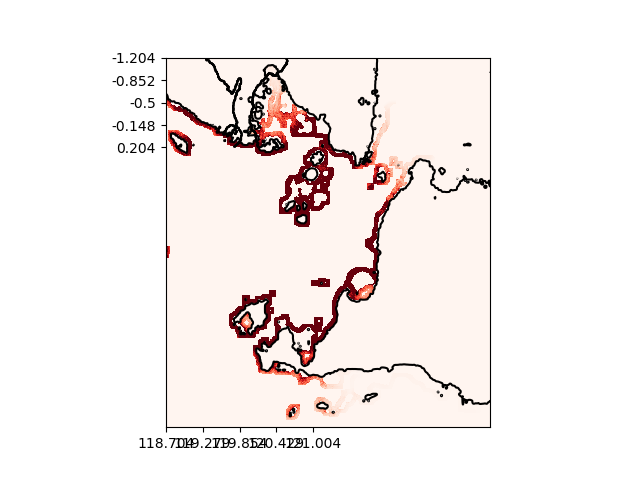

In [32]:
plt.figure()
coast = plt.contour(krakState.h[::-1,1150:]-0, levels=1, colors='black')
plt.imshow(krakMaxCoast[::-1,1150:], cmap='Reds', vmax=0.07)
xtixks = plt.xticks(np.linspace(0, krak['h'].shape[1]-1150, 5),\
           np.round(np.linspace(krak['lon'][1150], krak['lon'][-1], 5), 2))
yticks = plt.yticks(np.linspace(0, krak['h'].shape[0], 5),\
           np.round(np.linspace(krak['lat'][0], krak['lat'][-1], 5), 2))
plt.savefig('../results/krakmaxcoast')

<IPython.core.display.Javascript object>


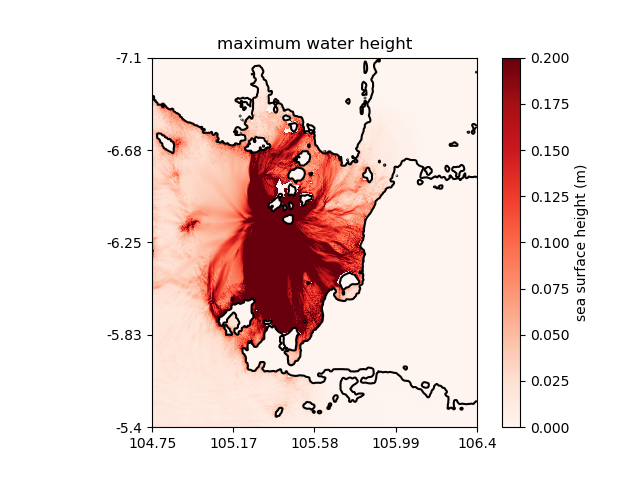

In [42]:
# r = 50
# for i in range(krakMaxCoast.shape[0]):
#     for j in range(krakMaxCoast.shape[1]):
#         krakMaxCoast *= int(np.less(krakMaxCoast[i-r:i+r,j-r:j+r], 20).any())

fig = plt.figure(171)
ax = plt.subplot(1,1,1)
coast = plt.contour(krakState.h[::-1,1150:]-10, levels=1, colors='black')
im = plt.imshow(krakMax[::-1,1150:], cmap='Reds', vmax=0.2)
cb = plt.colorbar()
cb.set_label('sea surface height (m)')
plt.title('maximum water height')
xtixks = plt.xticks(np.linspace(0, krak['h'].shape[1]-1150, 5),\
           np.round(np.linspace(krak['lon'][1150], krak['lon'][-1], 5), 2))
yticks = plt.yticks(np.linspace(0, krak['h'].shape[0], 5),\
           np.round(np.linspace(krak['lat'][0], krak['lat'][-1], 5), 2))
plt.show()
plt.savefig('../results/krakmax2')

In [ ]:
fig = plt.figure(173)
ax = plt.subplot(1,1,1)
coast = plt.contour(krakState.h[::-1]-7.5, levels=1, colors='black')
plt.title('maximum water height')
xtixks = plt.xticks(np.linspace(0, krak['h'].shape[1], 5),\
           np.round(np.linspace(krak['lon'][0], krak['lon'][-1], 5), 3))
yticks = plt.yticks(np.linspace(0, krak['h'].shape[0], 5),\
           np.round(np.linspace(krak['lat'][0], krak['lat'][-1], 5), 3))
arts = [(plt.imshow(frame[::-1], cmap='seismic', vmin=-0.05, vmax=0.05),) for frame in krakNtt]
cb = plt.colorbar()
cb.set_label('sea surface height (m)')
anim = animation.ArtistAnimation(fig, arts)

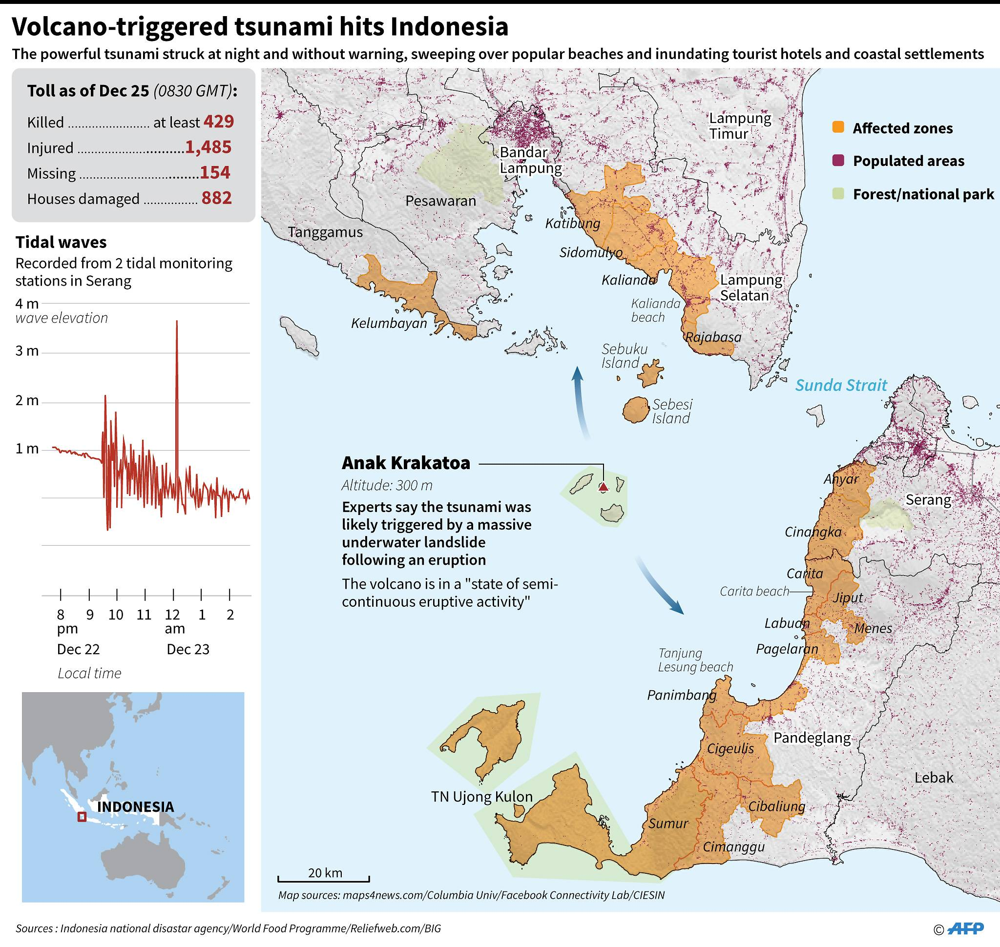

In [ ]:
ang = 8*np.pi/9
rpinitn = 5*planegauss(paluState.n.shape, \
                              wx = seiswidth, \
                              wy = seislength*3/2, \
                              cx = argcenter[0]-np.cos(ang)*argdist, \
                              cy = argcenter[1]-np.sin(ang)*argdist)#, \
#                               theta = ang+np.pi) \

In [ ]:
fig = plt.figure(205)
plt.imshow(rpinitn[::-1], cmap='seismic', vmin=-5, vmax=5)
plt.contour(rpalustate.h[::-1], levels=3, colors=['gray', 'gray', 'black'])
plt.show()

In [ ]:
rpalud = dict(palu) # create copy of Palu initial conditons
rpalud['n'] = rpinitn # with the initial SSH of this specific event
rpalustate = State(**rpalud) # turn into instance of State class
rpframes = simulate(rpalustate, 1700, timestep=genfb, nttname = 'rpalu', \
                    dudt_x=dudt_drive_numba, dvdt_x=dvdt_drive_numba, dndt_x=dndt_drive_numba, \
                    grav=True, cori=True, advx=True, advy=True, attn=True)[0] # simulate it

In [ ]:
rpframes2 = simulate(rpalustate, 1700, timestep=fbfeedback, nttname = 'rpalu2', \
                    dudt_x=dudt_drive_numba, dvdt_x=dvdt_drive_numba, dndt_x=dndt_drive_numba, \
                    grav=True, cori=True, advx=True, advy=True, attn=True)[0] # simulate it

In [ ]:
fig = plt.figure()
rpart = [(plt.imshow(rpframe, vmin=-5, vmax=5, cmap='seismic'),) for rpframe in rpframes[::100,::-1]]#np.linspace(0, frames.shape[0], 100)]]
anim = animation.ArtistAnimation(fig, rpart, interval=50, blit=True, repeat_delay=200)
plt.contour(rpalustate.h[::-1], levels=3, colors=['gray', 'gray', 'black'])
plt.colorbar()
anim.save('../results/rpalu.mp4')
plt.show()

In [ ]:
fig = plt.figure()
rpart2 = [(plt.imshow(rpframe, vmin=-5, vmax=5, cmap='seismic'),) for rpframe in rpframes2[::100,::-1]]#np.linspace(0, frames.shape[0], 100)]]
anim2 = animation.ArtistAnimation(fig, rpart2, interval=50, blit=True, repeat_delay=200)
plt.colorbar()
plt.contour(rpalustate.h[::-1], levels=3, colors=['gray', 'gray', 'black'])
anim2.save('../results/rpalu2.mp4')
plt.show()

In [ ]:
fig = plt.figure()
rpart12 = [(plt.imshow(rpframe, vmin=-0.5, vmax=0.5, cmap='seismic'),) for rpframe in (rpframes[::100,::-1]-rpframes2[::100,::-1])]#np.linspace(0, frames.shape[0], 100)]]
anim12 = animation.ArtistAnimation(fig, rpart12, interval=50, blit=True, repeat_delay=200)
plt.colorbar()
plt.contour(rpalustate.h[::-1], levels=3, colors=['gray', 'gray', 'black'])

anim12.save('../results/rpalu1-2.mp4')
plt.show()

In [ ]:
# create a case
def gencase(latst, laten, lonst, lonen, tsulat, tsulon, tsutheta, tsusize):
    case = {}
    latran = (latst, laten) # latitude range map covers
    lonran = (lonst, lonen) # longitude range map covers

    # calculate height of map  11100*lat degrees = meters
    # calculate width of map  1 lon degree = cos(lat) lat degrees, *11100 = meters
    # use lon degree size of average latitude
    realsize = (111000*(latran[1]-latran[0]),\
                   111000*(lonran[1]-lonran[0])\
                      *np.cos((latran[1]-latran[0])/2))# h, w of map in meters

    size = (100, 100) # grid size of the map lat, lon


    case['dx'] = np.single(realsize[1]/size[1], dtype=np.float32)
    case['dy'] = np.single(realsize[0]/size[0], dtype=np.float32)

    # read in bathymetry data
    bathdata = nc.Dataset('../data/bathymetry.nc','r')
    bathlat = bathdata.variables['lat']
    bathlon = bathdata.variables['lon']
    #calculate indexes of bathymetry dataset we need
    bathlatix = np.linspace(np.argmin(np.abs(bathlat[:]-latran[0])),\
                            np.argmin(np.abs(bathlat[:]-latran[1])),\
                            size[0], dtype=int)
    
    bathlonix = np.linspace(np.argmin(np.abs(bathlon[:]-lonran[0])),\
                            np.argmin(np.abs(bathlon[:]-lonran[1])),\
                            size[1], dtype=int)
    # print(bathlatix, bathlonix)
    case['h'] = np.asarray(-bathdata.variables['elevation'][bathlatix, bathlonix])
    case['lat'] = np.asarray(bathlat[bathlatix])
    case['lon'] = np.asarray(bathlon[bathlonix])

    case['n'] = seismic(size, 20, 50, tsusize, tsusize/3,\
                        cx=np.argmin(np.abs(case['lat']-tsulat)),\
                        cy=np.argmin(np.abs(case['lon']-tsulon)),\
                        theta=tsutheta)
    case['u'] = np.zeros((size[0]+1,size[1]), dtype=np.float32)
    case['v'] = np.zeros((size[0],size[1]+1), dtype=np.float32)
    caseState = State(**case)

    # plot bathymetry and initial SSH to confirm
    fig = plt.figure()
    coast = plt.contour(caseState.h, levels=1, colors='black')
    ssh = plt.imshow(caseState.n, cmap='seismic', vmin=-tsusize, vmax=tsusize)
    xtixks = plt.xticks(np.linspace(0, caseState.h.shape[1], 5),\
               np.round(np.linspace(caseState.lon[0], caseState.lon[-1], 5), 3))
    yticks = plt.yticks(np.linspace(0, caseState.h.shape[0], 5),\
               np.round(np.linspace(caseState.lat[0], caseState.lat[-1], 5), 3))
    
    return caseState

In [ ]:
latst = float(input('enter the first latitude coordinate: '))
latend = float(input('enter the last latitude coordinate: '))
lonst = float(input('enter the first longitude coordinate: '))
lonend = float(input('enter the last longitude coordinate: '))
tsulat = float(input('enter the latitude of the initial tsunami: '))
tsulon = float(input('enter the longitude of the initial tsunami: '))
tsutheta = float(input('enter the angle of the tsunami: '))
tsusize = float(input('enter the height (meters) of the tsunami: '))
caseSt = gencase(latst, latend, lonst, lonend, tsulat, tsulon, tsutheta, tsusize)
if input('does this figure look right (y/n)?') == 'y':
    print('running simulation...')
    caseTT, caseMax, caseMin = simulate(gencase, 100, nttname='usercase')

In [ ]:
seismic?

In [ ]:
memmapar = np.memmap('memmaptest', dtype='float32', mode='w+', shape=(500, 500, 500))
numpyar = np.zeros((500, 500,500), dtype=np.float32)
%timeit memmapar[0] = testdata
%timeit numpyar[0] = testdata